# Notebook "1_Besoin_2_Exploration_EPA_BDF"


## Description

Ce notebook se focalise sur l'analyse exploratoire des données EPA "Bruit de fond". Cette analyse se décompose en deux grande partie :
- Etude des valeurs brutes
- Etude des différentes normalisations (de A à E)

## Structure du notebook

Ce notebook est construit de plusieurs parties :
- I. Import des bibliothèques
- II. Chargement des données
- III. Création des features pour l'analyse
- IV. Analyse des valeurs brutes à l'aide d'histogrammes
- V. Analyse des valeurs brutes à l'aide de boxplot
- VI. Analyse des valeurs normalisées

## Prérequis

### Source de données

Pour que le notebook fonctionne, la base de données EPA "Bruit de fond" doit être disponible dans le même fichier que le notebook. Par ailleurs, cette source doit être au format csv avec le nom "DB_EPA_BDF.csv"

### Installation des prérequis techniques

Le notebook fonctionne sur Python 3.7 avec les bibliothèques suivantes :
- pandas
- seaborn
- matplotlib
- numpy
- scipy

# I- Importing librairies

In [1]:
import pandas as pd
from math import floor
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import intervals as I
from scipy import stats

# II- Uploading Data

Les données sont chargés à partir du CSV et quelques colonnes ont été modifiés

In [2]:
df = pd.read_csv('DB_EPA_BDF.csv', sep=';')

#Remplace la virgule par un point
def clean(x):
    if not pd.isna(x):
        s=x.replace(',','.')
        s=float(s)
        return(s)

COLUMNS_NOT_TO_CLEAN = ['Site', 'Type', 'Dates', 'Site #', 'Moment', 'Year', 'Season']
for i in df.columns:
    if i not in COLUMNS_NOT_TO_CLEAN:
        df[i]=df[i].apply(clean)

# III- Creating new features

Définition des totaux pour les congénères

In [3]:
PCDDF = ['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season',
       '2378-TCDD', '12378-PCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', 'OCDD', '2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF', 'OCDF',
       'Total TCDF', 'Total TCDD', 'Total PeCDF', 'Total PeCDD', 'Total HxCDF',
       'Total HxCDD', 'Total HpCDF', 'Total HpCDD']

df=df[PCDDF]
PCDD = ['2378-TCDD', '12378-PCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', 'OCDD']

PCDF = ['2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF', 'OCDF']

df['PCDD TOTAL'] = 0
for i in PCDD:
    df['PCDD TOTAL'] = df['PCDD TOTAL'] + df[i]
    

df['PCDF TOTAL'] = 0
for i in PCDF:
    df['PCDF TOTAL'] = df['PCDF TOTAL'] + df[i]
    
df['TOTAL'] = df['PCDD TOTAL'] + df['PCDF TOTAL']

# IV- Histograms
## 1- Total PCDD and PCDF

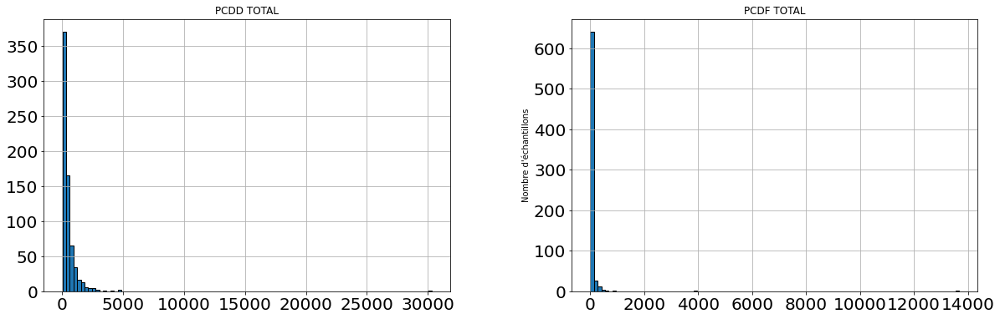

In [4]:
df_num = df[['PCDF TOTAL','PCDD TOTAL']]
df_num.hist(figsize=(20, 6), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.ylabel("Nombre d'échantillons")
plt.show()

## 2- PCDD

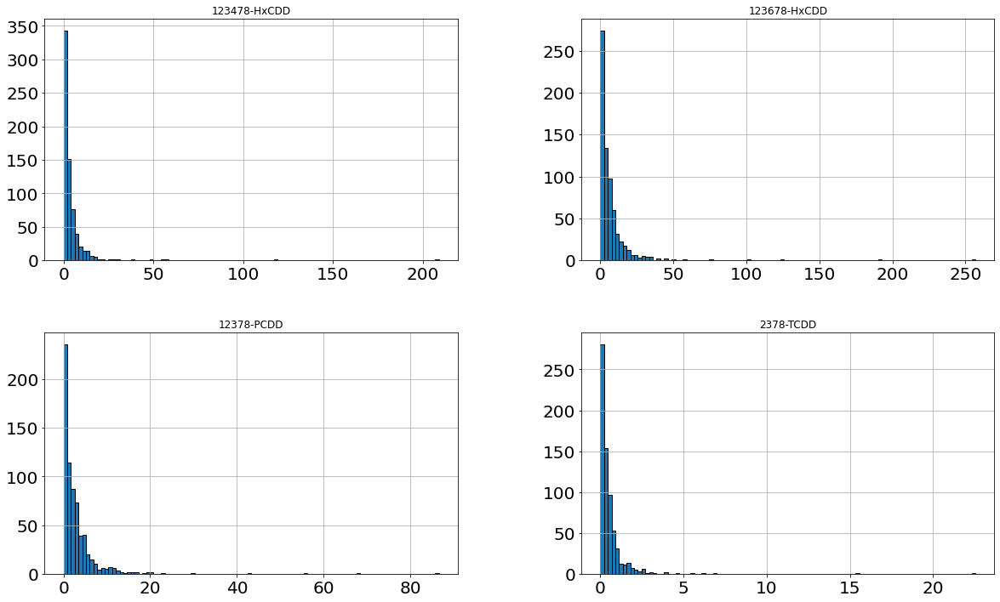

In [5]:
df_num = df[PCDD[:4]]

df_num.hist(figsize=(20, 12), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.show()

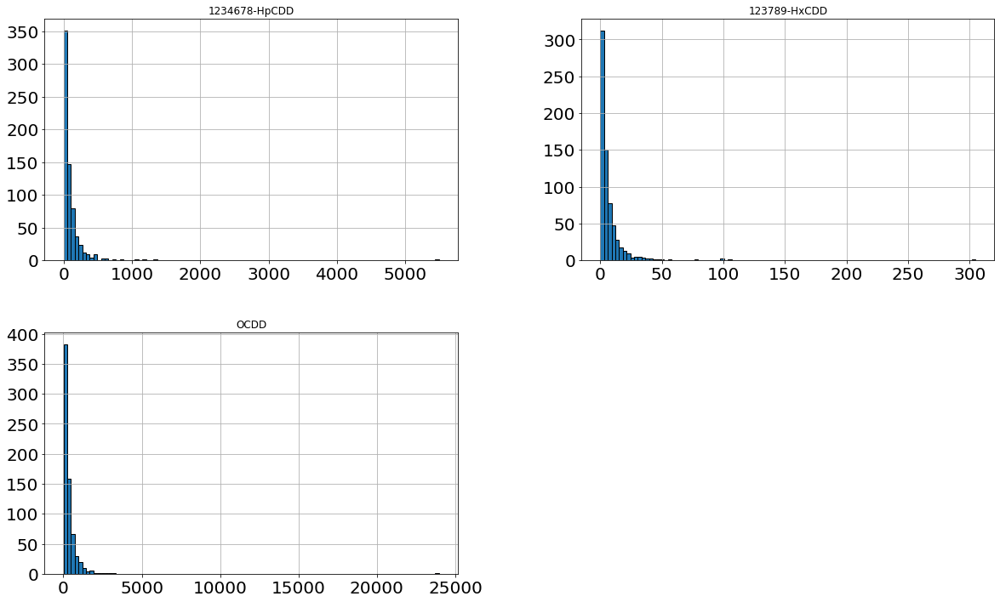

In [6]:
df_num = df[PCDD[4:]]

df_num.hist(figsize=(20, 12), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.show()

## 3- PCDF

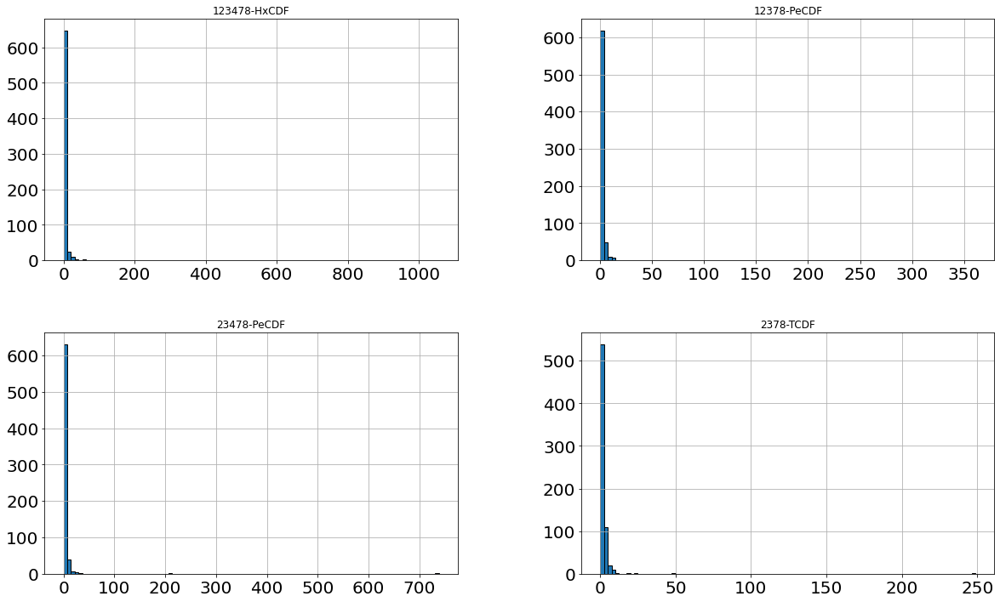

In [7]:
df_num = df[PCDF[:4]]

df_num.hist(figsize=(20, 12), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.show()

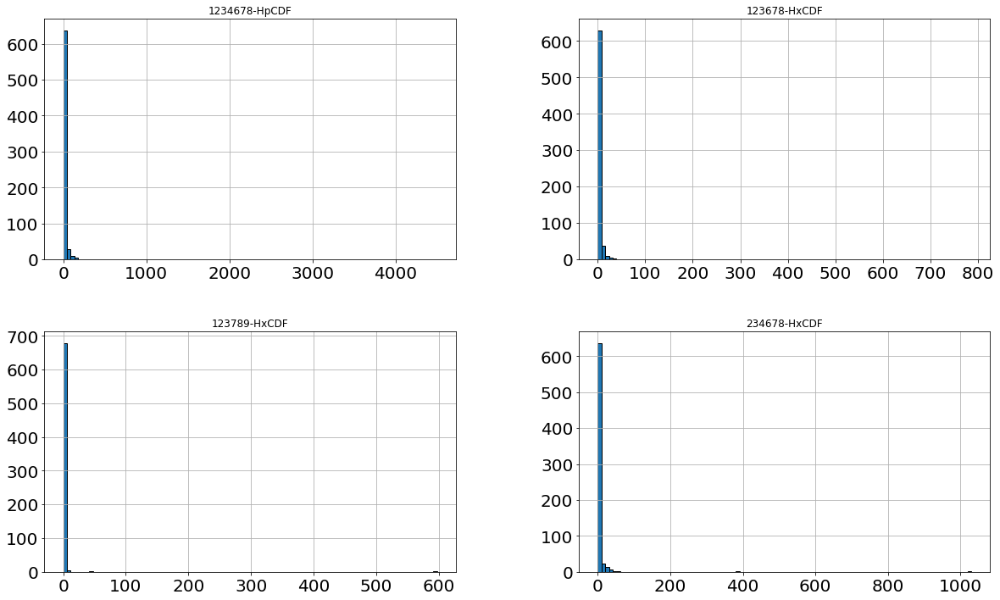

In [8]:
df_num = df[PCDF[4:8]]

df_num.hist(figsize=(20, 12), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.show()

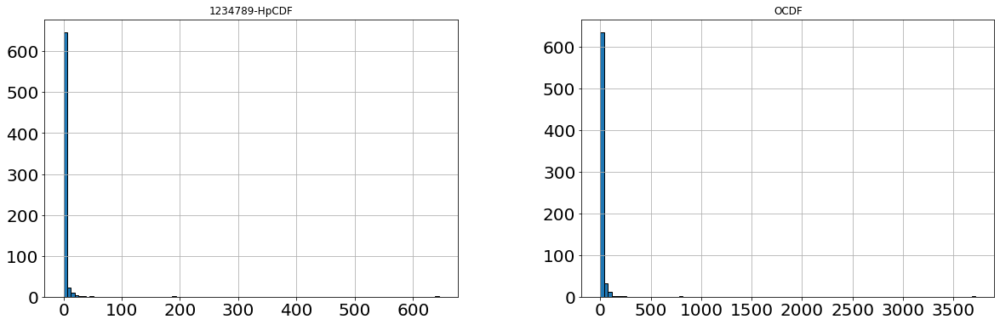

In [9]:
df_num = df[PCDF[8:]]

df_num.hist(figsize=(20, 6), bins=100, xlabelsize=20, ylabelsize=20, ec='k')
plt.show()

# V- Boxplots by feature:
## 1- Site type
### 1.1- Site type with outliers

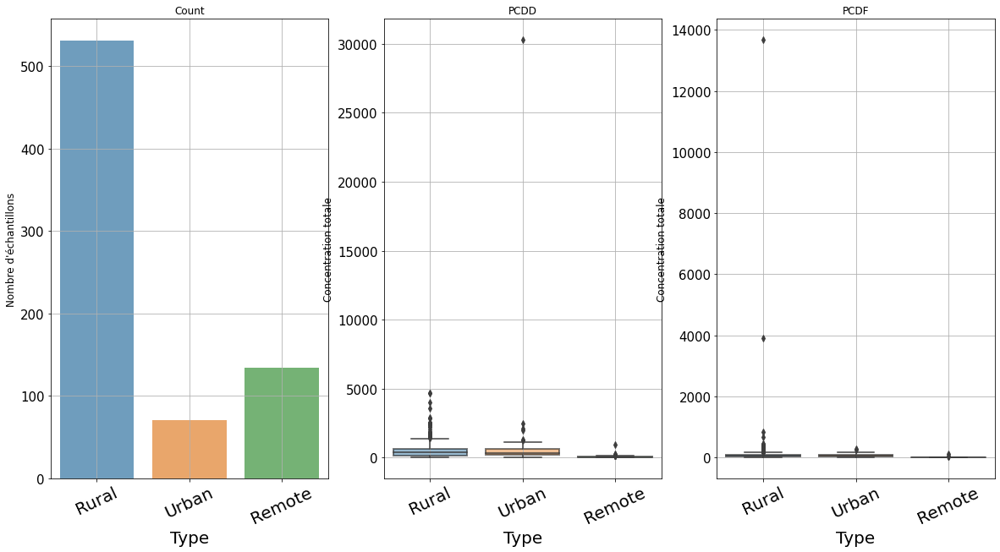

In [10]:
X='Type'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))

ax = plt.subplot(1,3,1)
ax1 = sns.countplot(x=X, alpha=0.7, data=df)
ax1.set_xlabel(X, fontsize = 20)
ax1.set_ylabel('', fontsize = 12)
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Nombre d'échantillons")
plt.title('Count')
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Y, data=df)
ax.set_xlabel(X, fontsize = 20)
ax.set_ylabel('', fontsize = 12)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Concentration totale")
plt.title('PCDD')
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Z, data=df)
ax.set_xlabel(X, fontsize = 20)
ax.set_ylabel('', fontsize = 12)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Concentration totale")
plt.title('PCDF')
plt.grid()

plt.show()

### 1.2- Site type without outliers

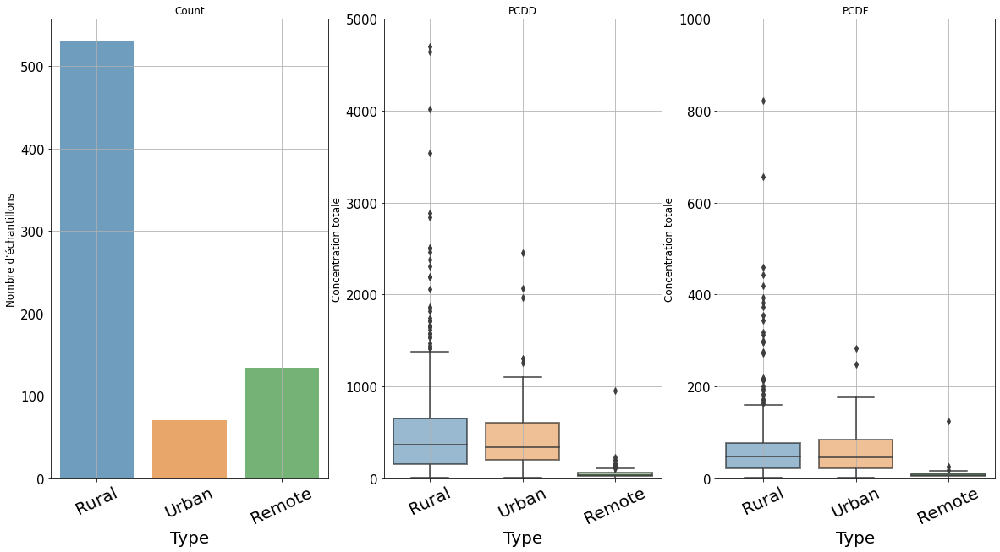

In [11]:
X='Type'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))


ax = plt.subplot(1,3,1)
ax1 = sns.countplot(x=X, alpha=0.7, data=df)
ax1.set_xlabel(X, fontsize = 20)
ax1.set_ylabel('', fontsize = 12)
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Nombre d'échantillons")
plt.title('Count')
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Y, data=df)
ax.set_xlabel(X, fontsize = 20)
ax.set_ylabel('', fontsize = 12)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.ylim(0,5000)
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Concentration totale")
plt.title('PCDD')
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Z, data=df)
ax.set_xlabel(X, fontsize = 20)
ax.set_ylabel('', fontsize = 12)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.ylim(0,1000)
plt.xticks(fontsize = 20, rotation=25)
plt.yticks(fontsize = 15)
plt.ylabel("Concentration totale")
plt.title('PCDF')
plt.grid()

plt.show()

## 2- Season

### 2.1- Season with outliers

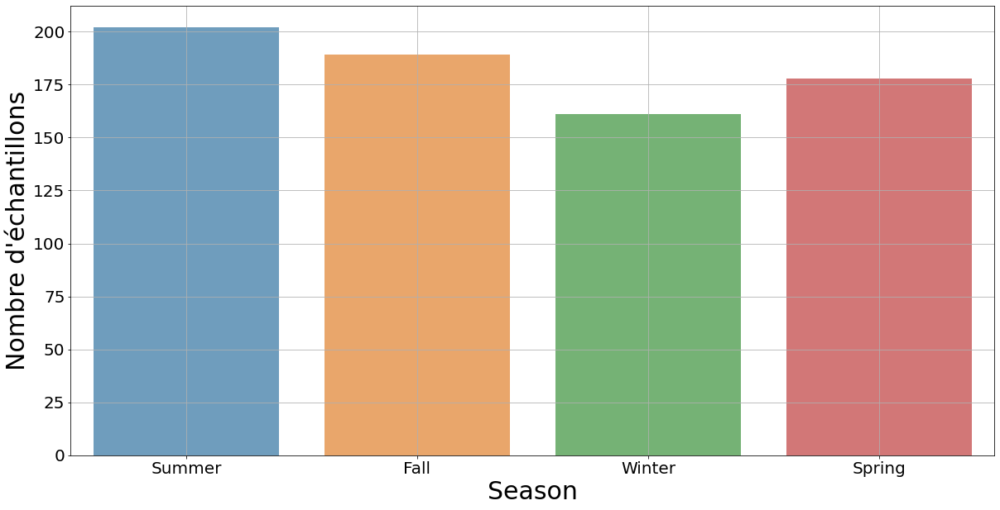

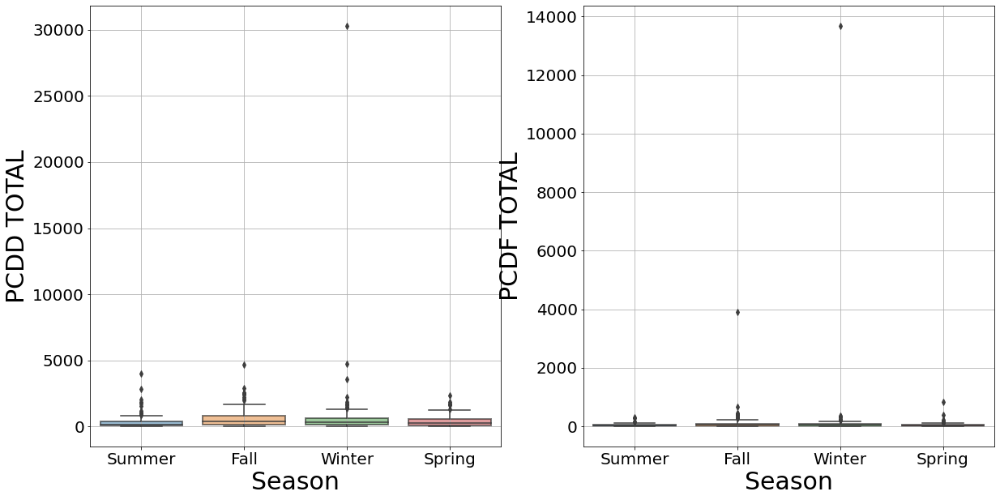

In [12]:
X='Season'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()


fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,10))


ax = plt.subplot(1,2,1)
ax = sns.boxplot(x=X, y=Y, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
# plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,2,2)
ax = sns.boxplot(x=X, y=Z, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
# plt.ylim(0,1000)
plt.grid()


plt.show()

### 2.2- Season without outliers global

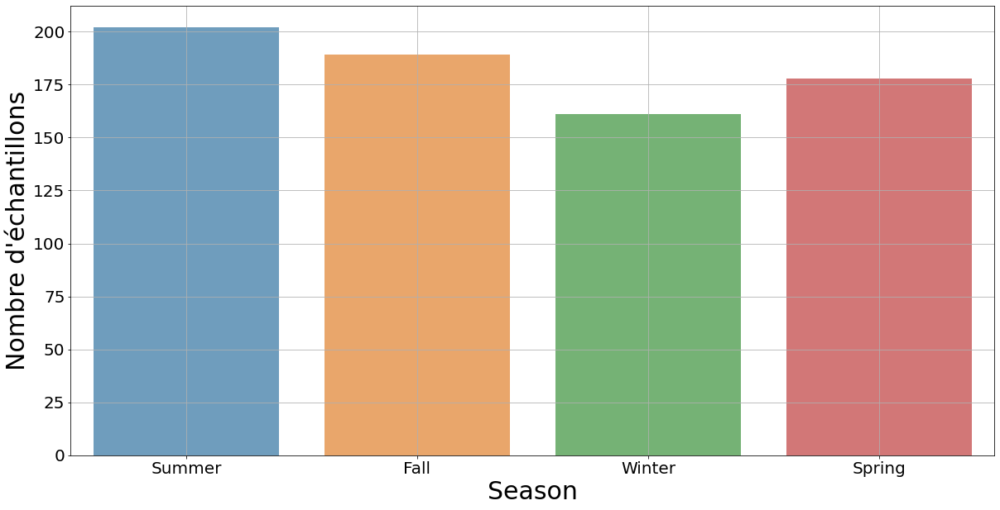

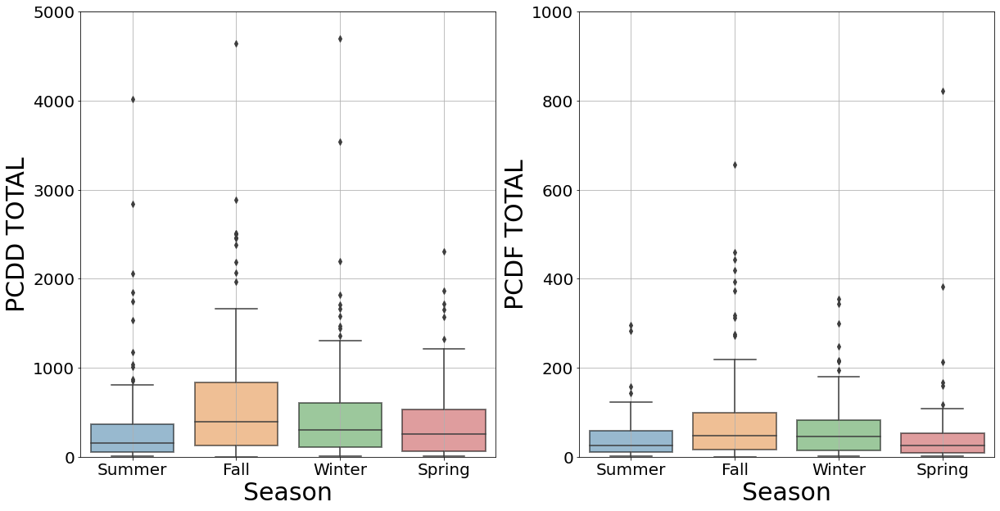

In [13]:
X='Season'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()


fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,10))


ax = plt.subplot(1,2,1)
ax = sns.boxplot(x=X, y=Y, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,2,2)
ax = sns.boxplot(x=X, y=Z, data=df, order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1000)
plt.grid()


plt.show()

### 2.3- Season without outliers focus by site type

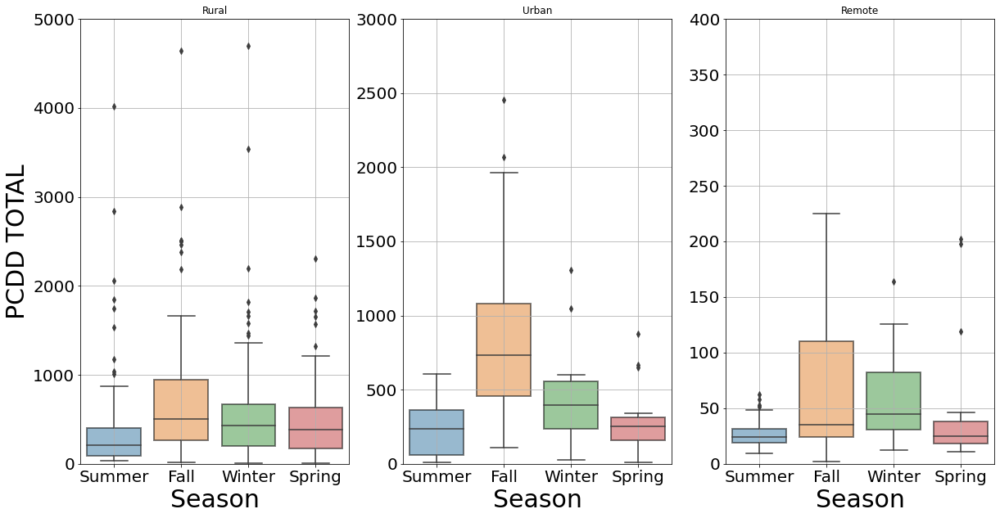

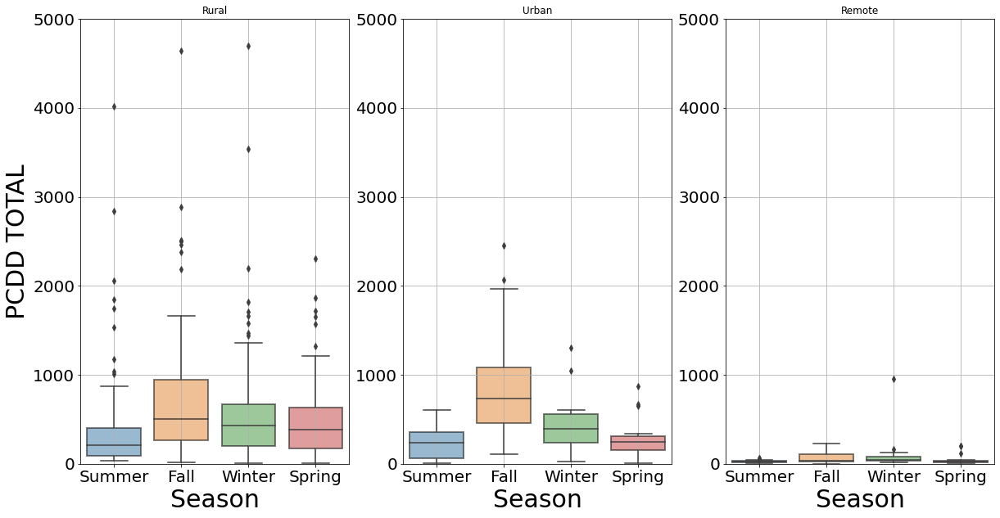

In [14]:
X='Season'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


# PCDD

fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))


ax = plt.subplot(1,3,1)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Rural'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Rural')
plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Urban'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Urban')
plt.ylim(0,3000)
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Remote'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Remote')
plt.ylim(0,400)
plt.grid()


plt.show()


fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))


ax = plt.subplot(1,3,1)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Rural'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Rural')
plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Urban'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Urban')
plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Remote'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Remote')
plt.ylim(0,5000)
plt.grid()


plt.show()

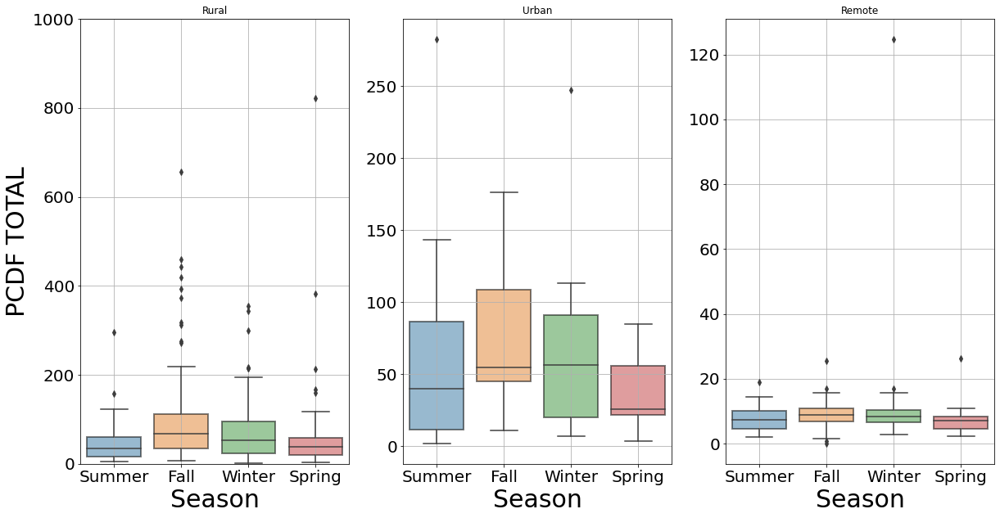

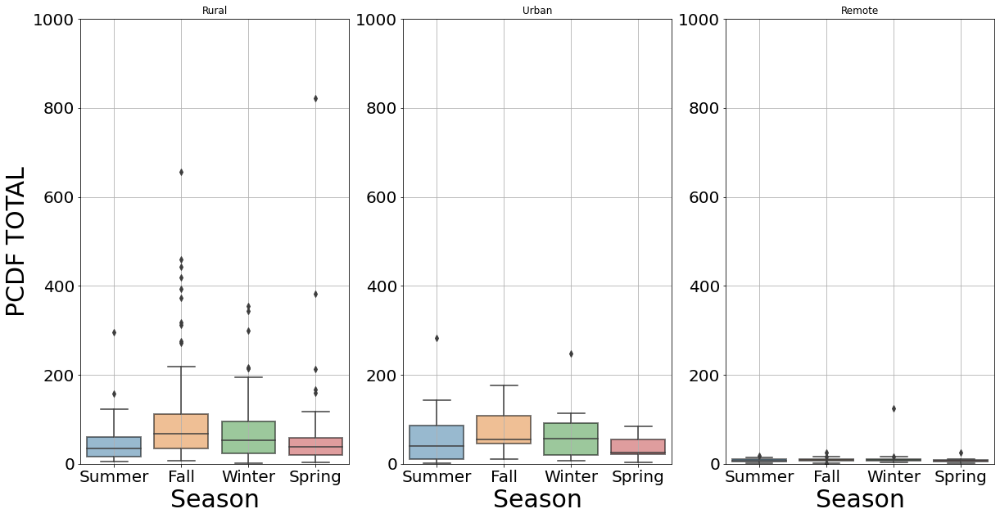

In [15]:
X='Season'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


# PCDF


fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))


ax = plt.subplot(1,3,1)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Rural'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Rural')
plt.ylim(0,1000)
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Urban'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Urban')
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Remote'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Remote')
plt.grid()

plt.show()


fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20,10))


ax = plt.subplot(1,3,1)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Rural'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Rural')
plt.ylim(0,1000)
plt.grid()

ax = plt.subplot(1,3,2)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Urban'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1000)
plt.title('Urban')
plt.grid()

ax = plt.subplot(1,3,3)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Remote'], order=["Summer", "Fall", "Winter", "Spring"])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.title('Remote')
plt.ylim(0,1000)
plt.grid()

plt.show()

## 3- Moment

### 3.1- Moment with outliers

In [16]:
B=[]
for j in range(1,30):
    if [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Summer':
        B.append('r')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Fall':
        B.append('y')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Winter':
        B.append('b')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Spring':
        B.append('g')

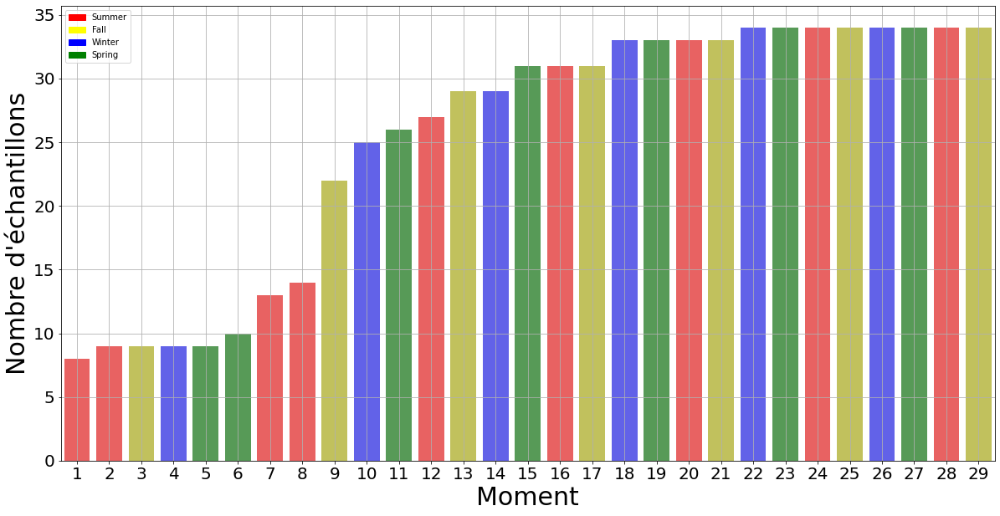

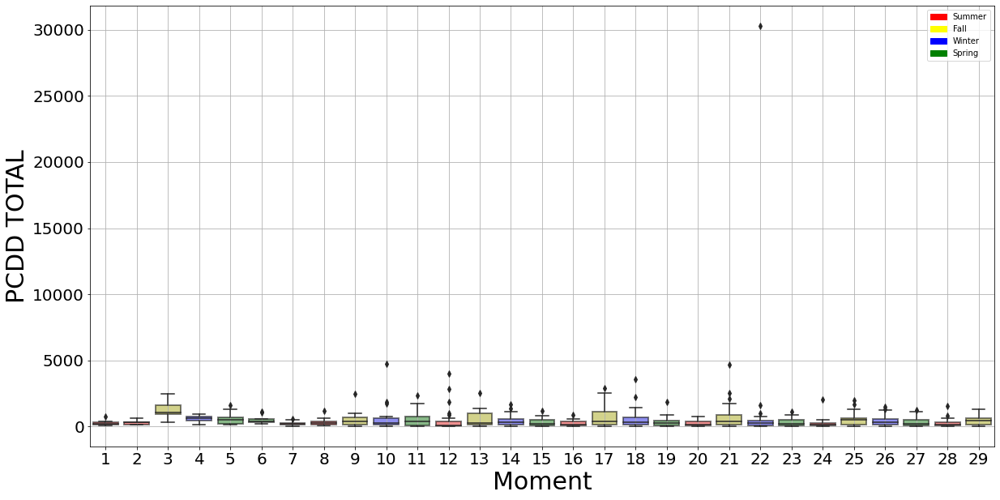

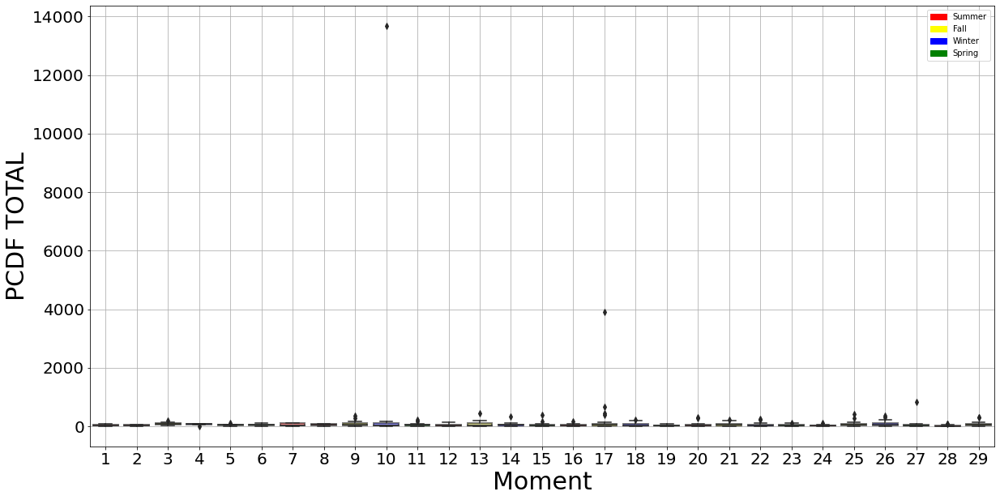

In [17]:
X='Moment'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, palette=B)
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])


plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Y, data=df, palette=B)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])


plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Z, data=df, palette=B)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])


plt.show()

### 3-2- Moment without ouliers

In [18]:
B=[]
for j in range(1,30):
    if [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Summer':
        B.append('r')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Fall':
        B.append('y')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Winter':
        B.append('b')
    elif [i for i in df[['Moment', 'Season']].values if i[0]==j][0][1] == 'Spring':
        B.append('g')

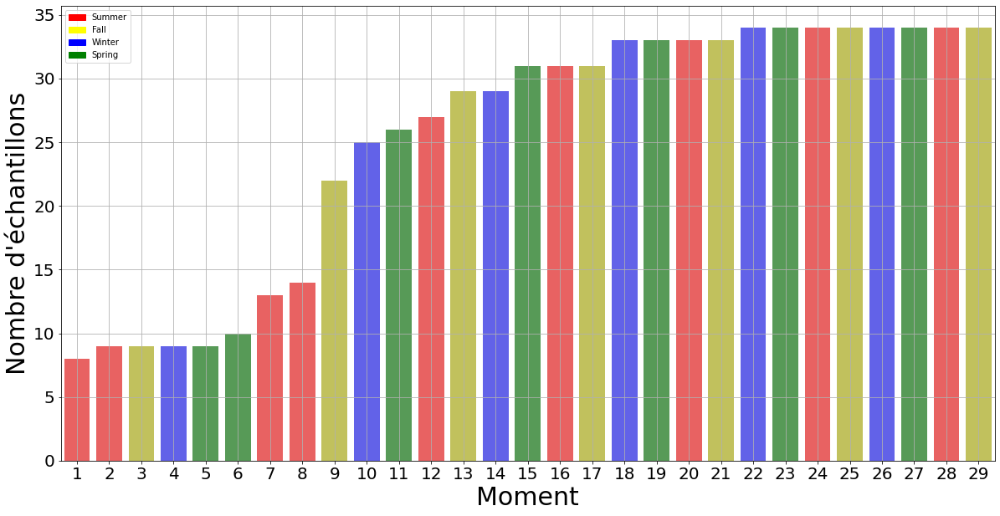

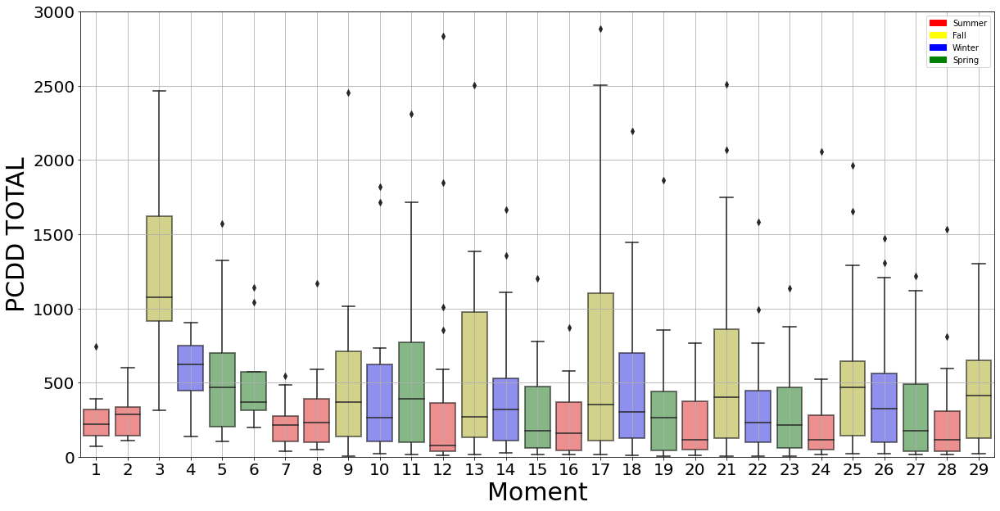

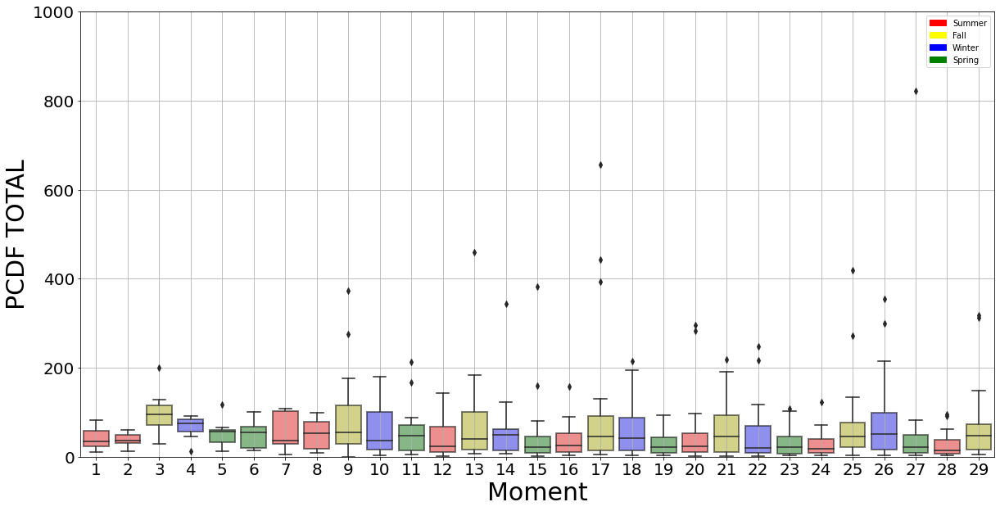

In [19]:
X='Moment'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, palette=B)
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])


plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Y, data=df, palette=B)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,3000)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])

plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Z, data=df, palette=B)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1000)
plt.grid()
Summer_patch = mpatches.Patch(color='red', label='Summer')
Fall_patch = mpatches.Patch(color='yellow', label='Fall')
Winter_patch = mpatches.Patch(color='blue', label='Winter')
Spring_patch = mpatches.Patch(color='green', label='Spring')
plt.legend(handles=[Summer_patch, Fall_patch, Winter_patch, Spring_patch])

plt.show()

## 4- Site number

### 4.1- Site number with outliers

In [20]:
[i for i in df[['Site #', 'Type']].values if i[0]==3][0][1]
L=[]
for j in range(1,36):
    if j==2:
        continue
    if [i for i in df[['Site #', 'Type']].values if i[0]==j][0][1] == 'Rural':
        L.append('r')
    elif [i for i in df[['Site #', 'Type']].values if i[0]==j][0][1] == 'Remote':
        L.append('g')
    elif [i for i in df[['Site #', 'Type']].values if i[0]==j][0][1] == 'Urban':
        L.append('b')

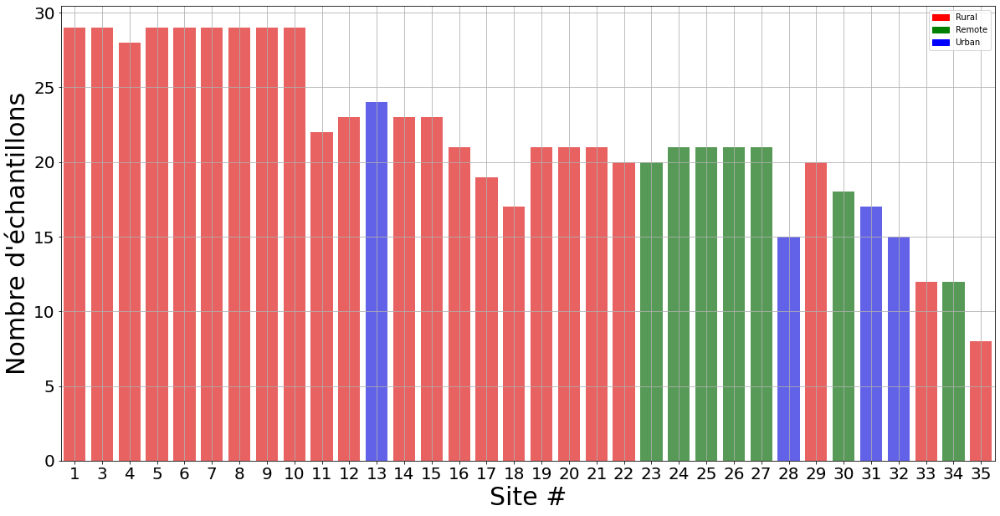

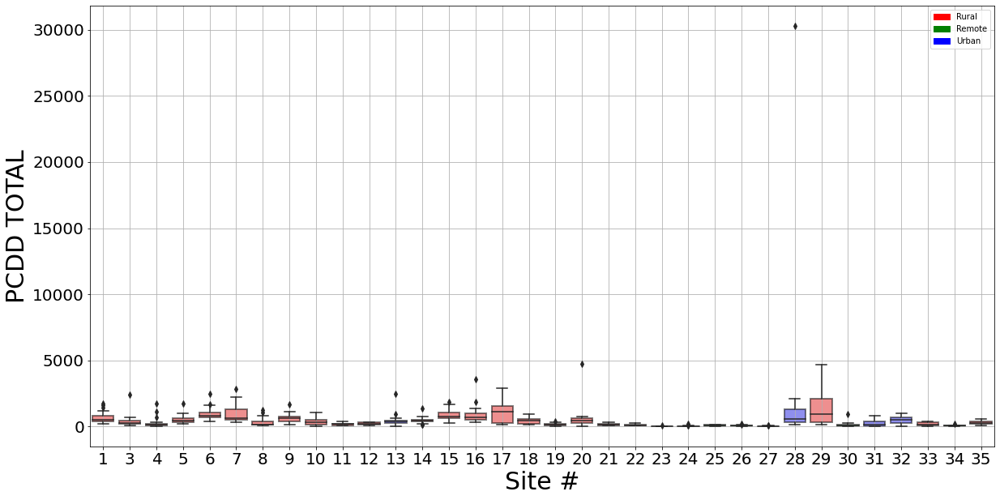

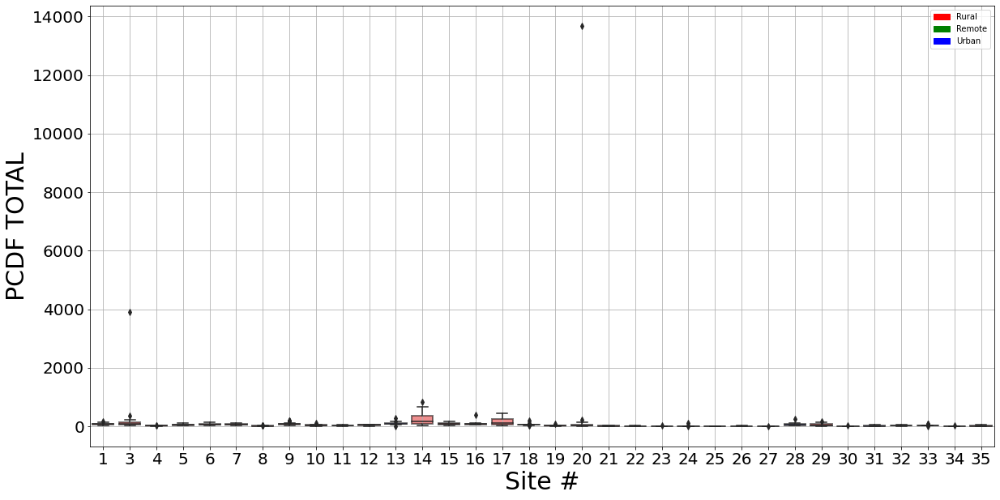

In [21]:
X='Site #'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, palette=L)
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])


plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Y, data=df, palette=L)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
# plt.ylim(0,3000)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Z, data=df, palette=L)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
# plt.ylim(0,1000)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 4.2- Site number without outliers global

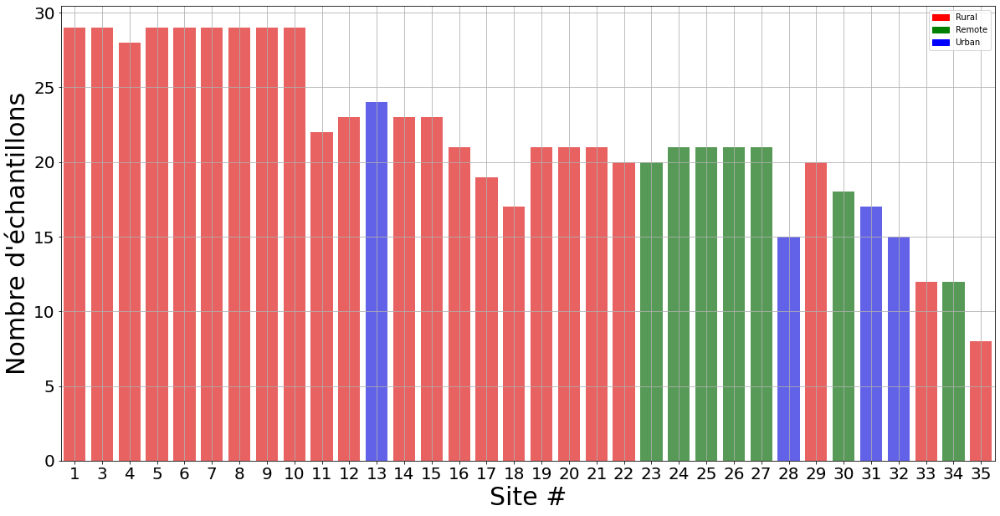

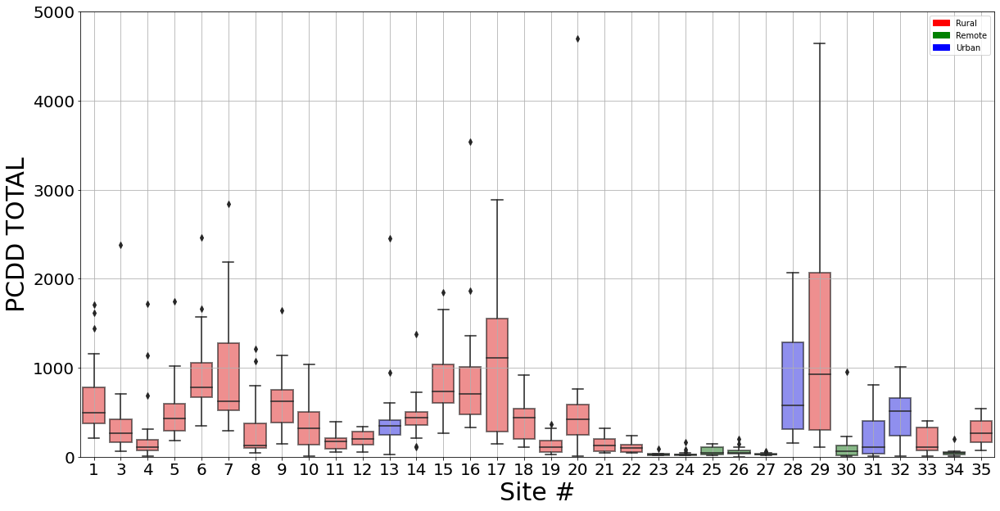

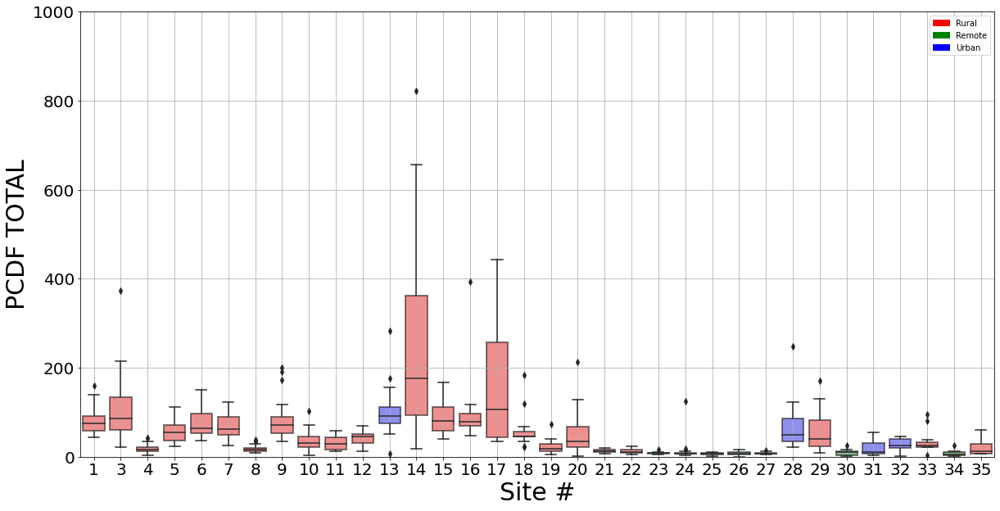

In [22]:
X='Site #'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

plt.figure(figsize = (20, 10))
ax1=sns.countplot(x=X, alpha=0.7, data=df, palette=L)
ax1.set_xlabel(X, fontsize = 30)
ax1.set_ylabel("Nombre d'échantillons", fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])


plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Y, data=df, palette=L)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,5000)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Z, data=df, palette=L)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z, fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1000)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])


plt.show()

### 4.3- Site number with outliers focus by site type

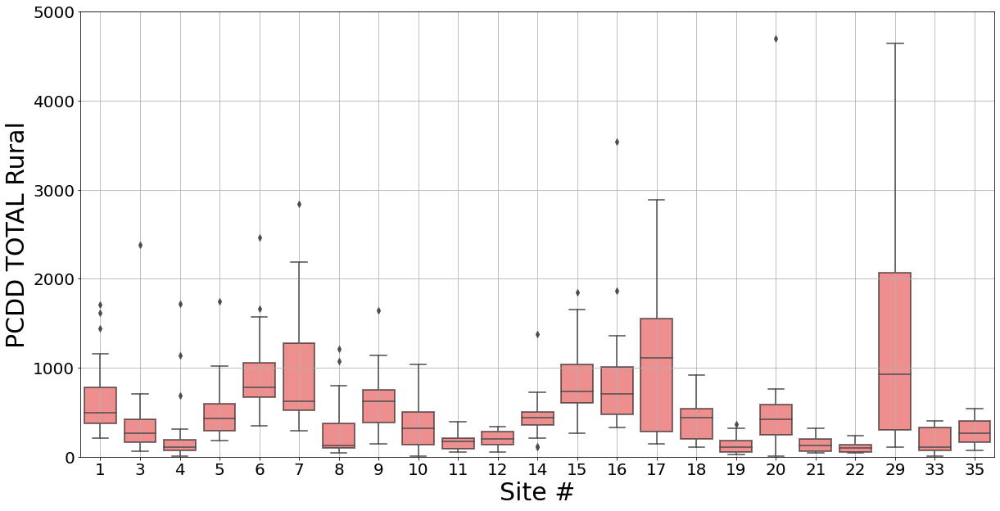

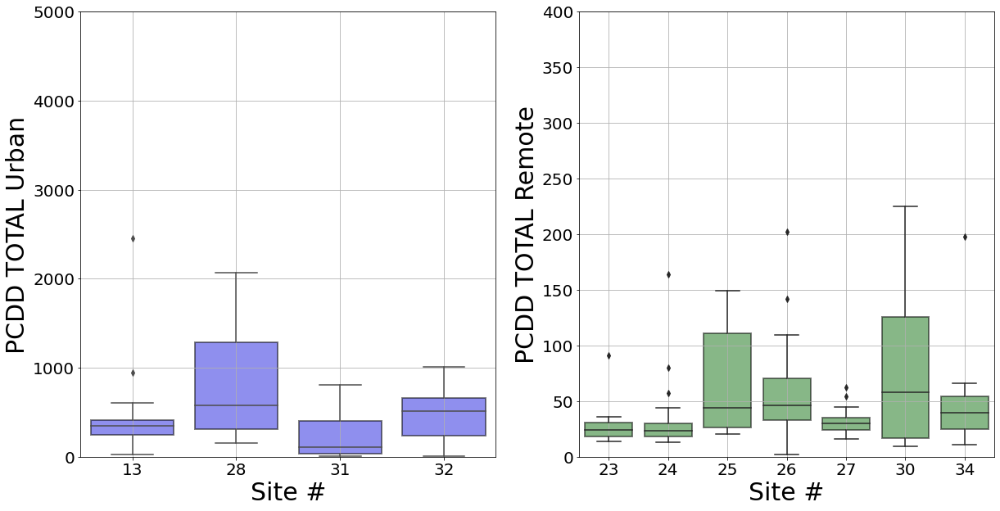

In [23]:
X='Site #'
Y='PCDD TOTAL'
Z='PCDF TOTAL'

# PCDD

plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Rural'], palette=['r' for i in range(23)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y+' Rural', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,5000)
plt.grid()

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,10))


ax = plt.subplot(1,2,1)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Urban'], palette=['b' for i in range(4)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y+' Urban', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,5000)
plt.grid()

ax = plt.subplot(1,2,2)
ax = sns.boxplot(x=X, y=Y, data=df[df['Type']=='Remote'], palette=['g' for i in range(7)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y+' Remote', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,400)
plt.grid()



plt.show()

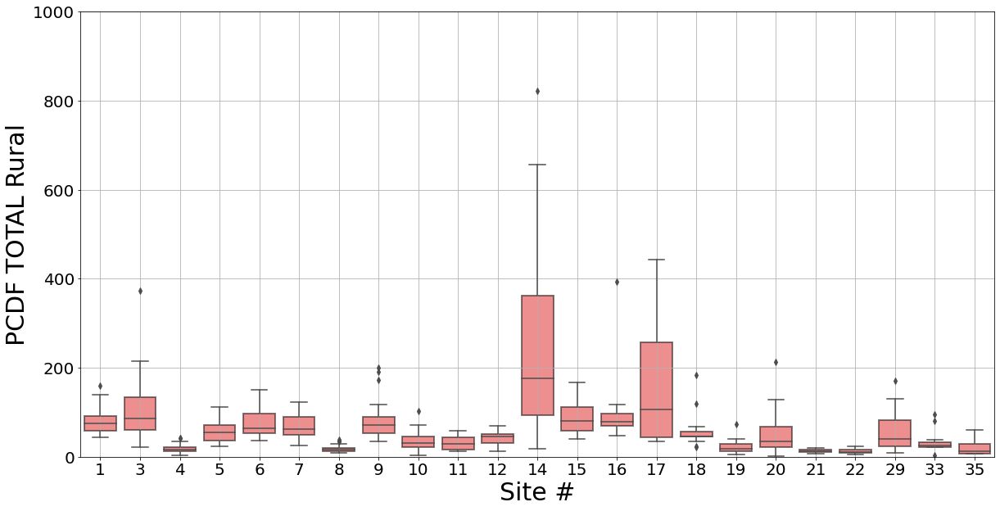

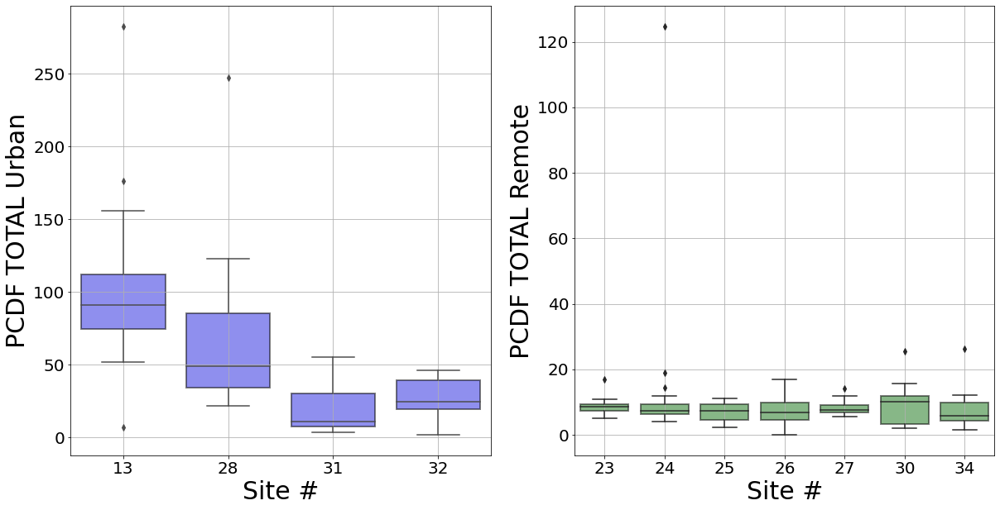

In [24]:
X='Site #'
Y='PCDD TOTAL'
Z='PCDF TOTAL'


# PCDF

plt.figure(figsize = (20, 10))
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Rural'], palette=['r' for i in range(23)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z+' Rural', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1000)
plt.grid()

fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(20,10))


ax = plt.subplot(1,2,1)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Urban'], palette=['b' for i in range(4)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z+' Urban', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()

ax = plt.subplot(1,2,2)
ax = sns.boxplot(x=X, y=Z, data=df[df['Type']=='Remote'], palette=['g' for i in range(7)])
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Z+' Remote', fontsize = 30)
plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.grid()


plt.show()

# Site 20 :
Outlier (PCDF) ?

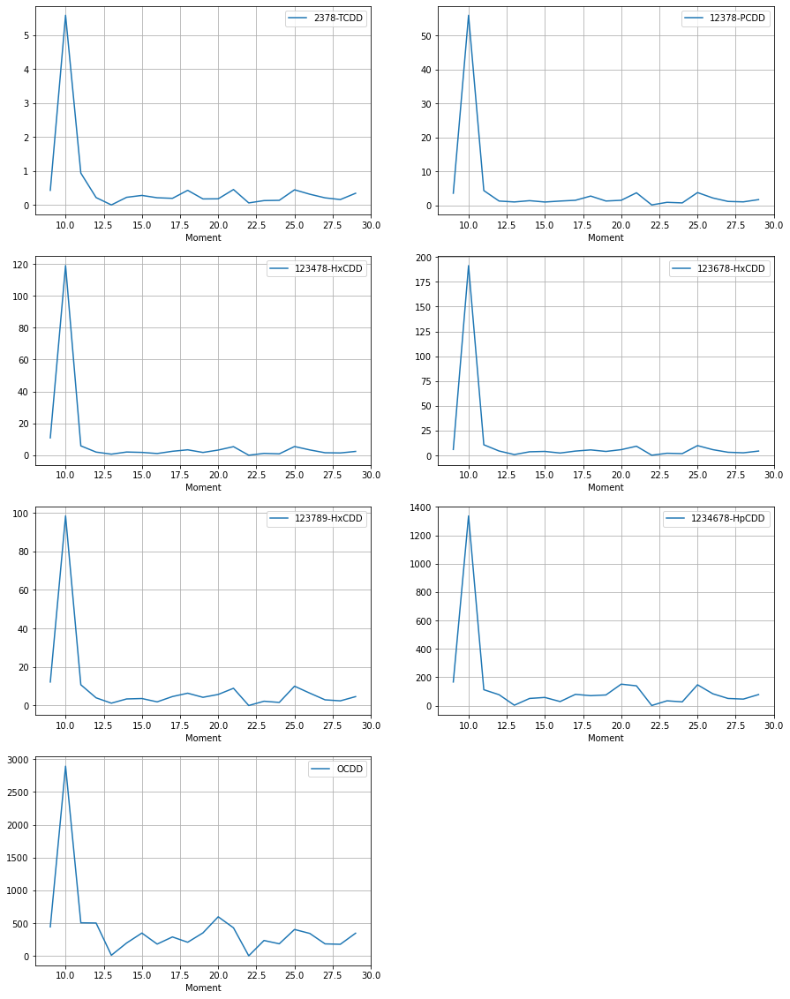

In [25]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==20].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

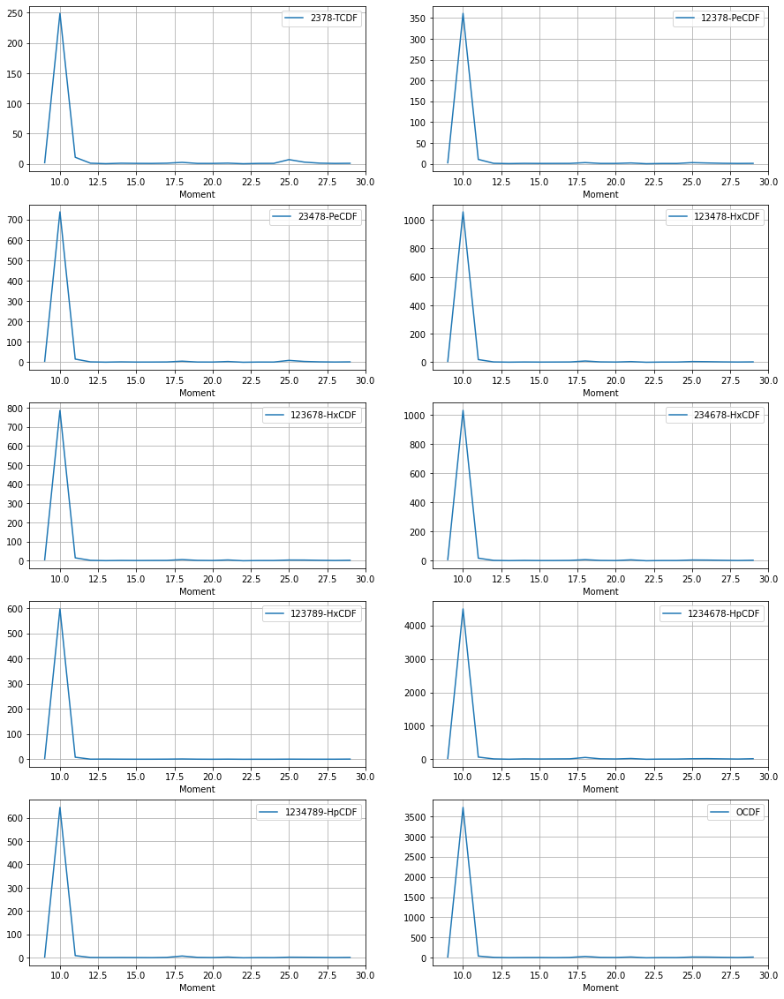

In [26]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==20].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# Site 3 :
Outlier (PCDF) ?

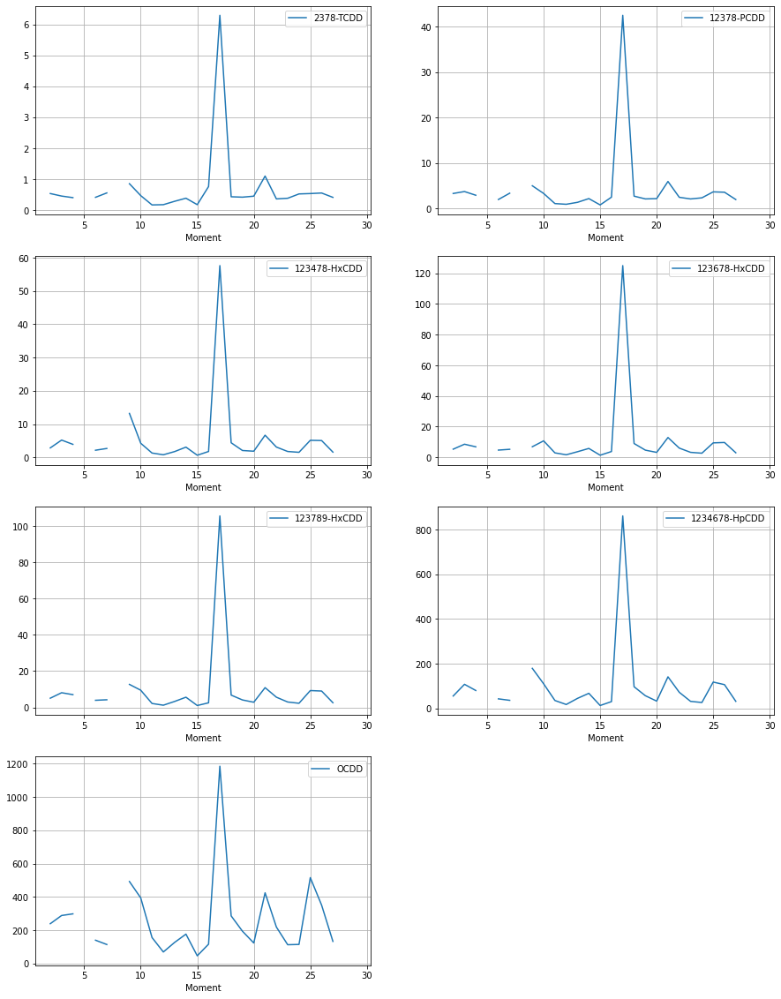

In [27]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==3].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

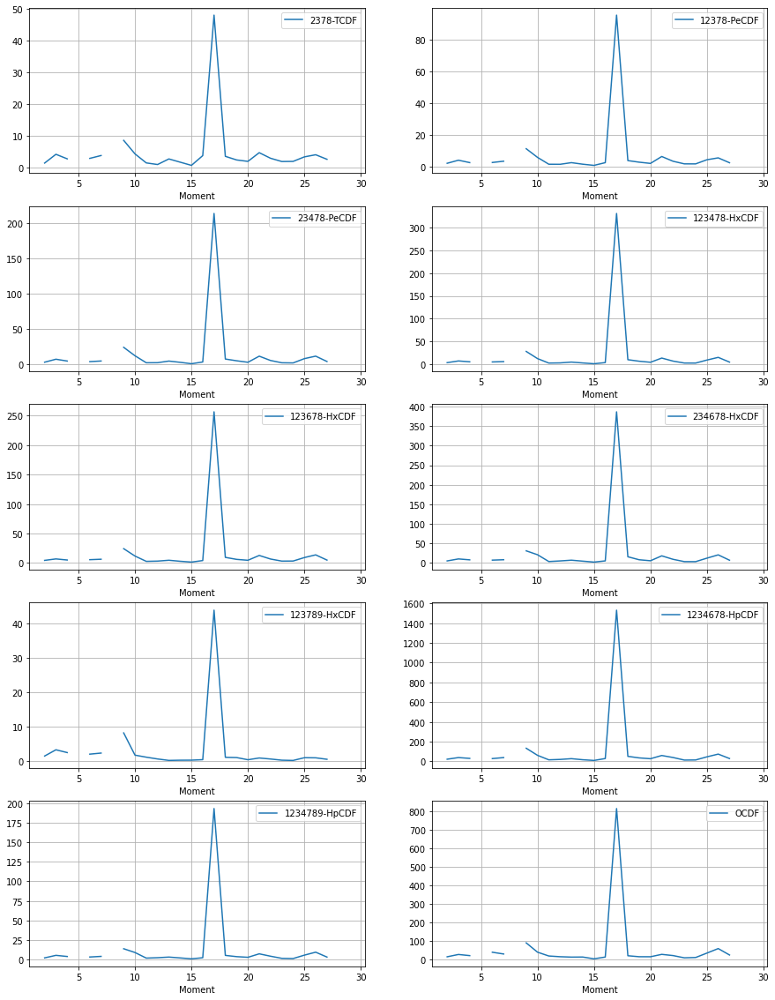

In [28]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==3].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# Site 28 :
Outlier (PCDD) ?

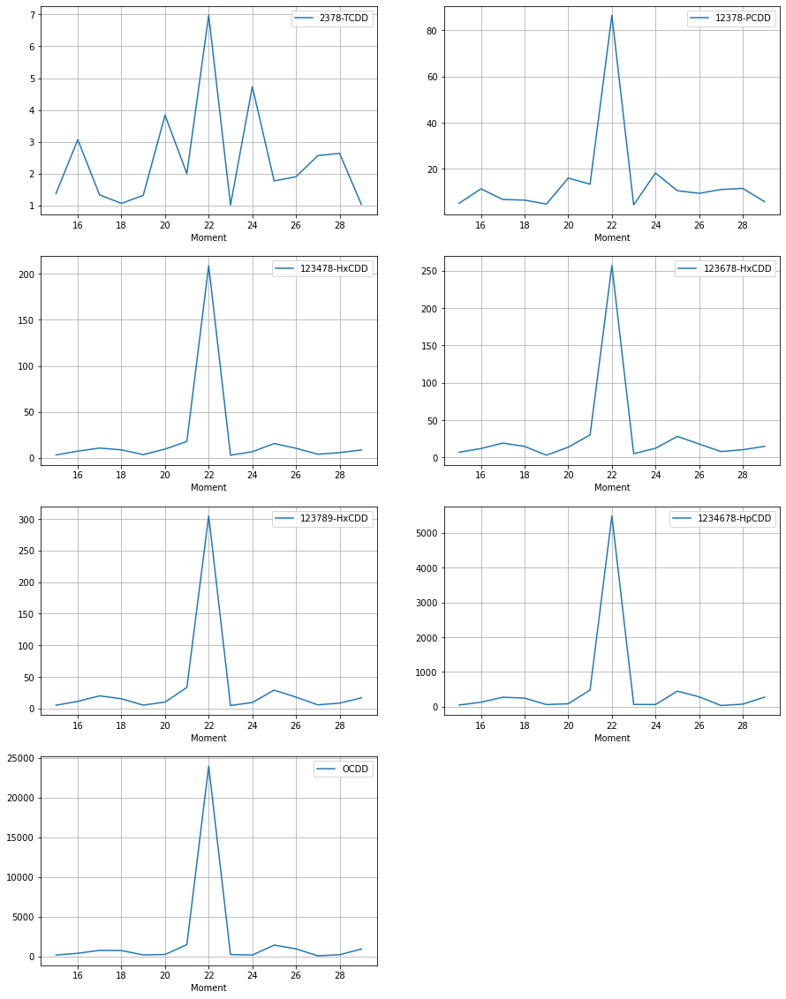

In [29]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==28].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

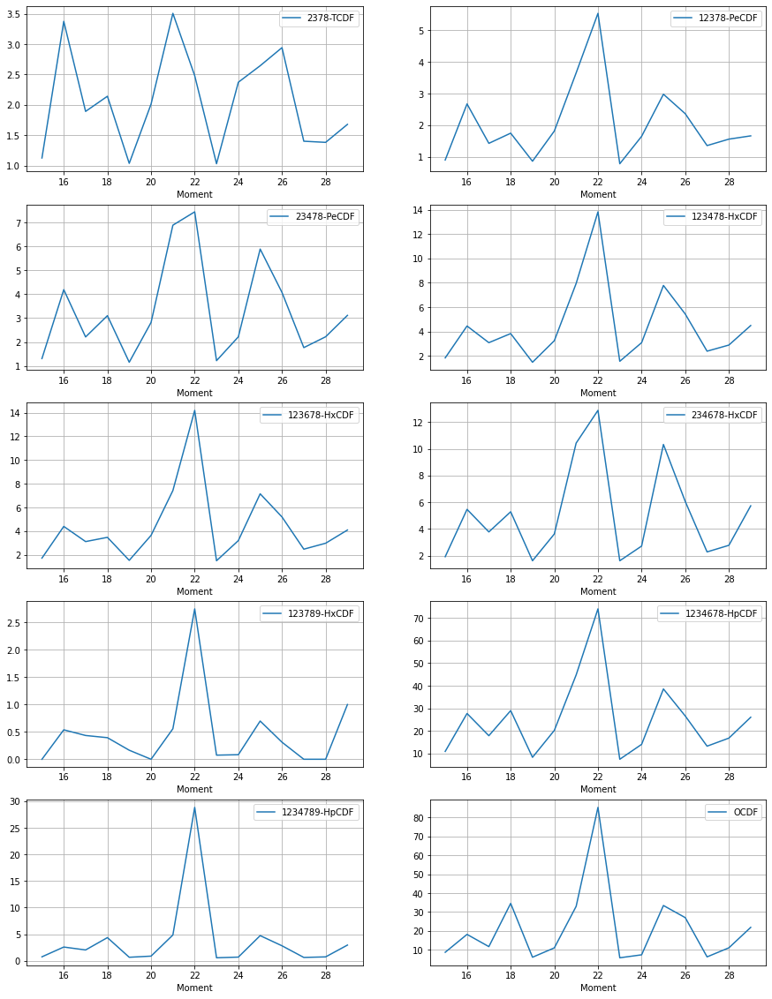

In [30]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==28].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# Site 17 :
Highest PCDD median

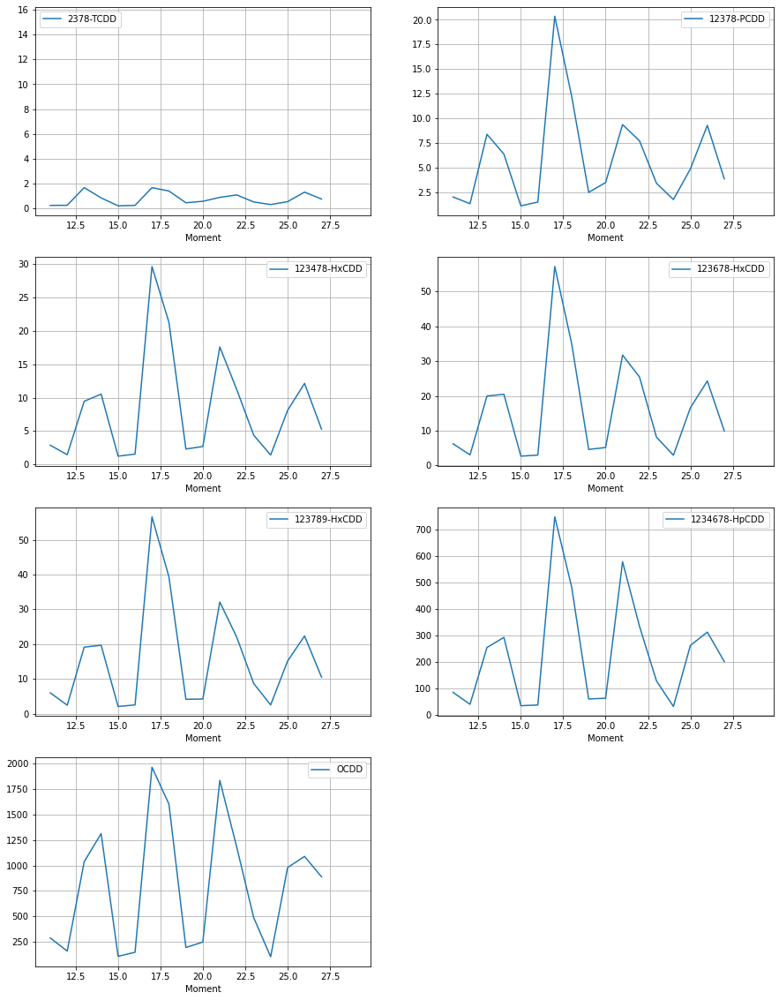

In [31]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==17].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

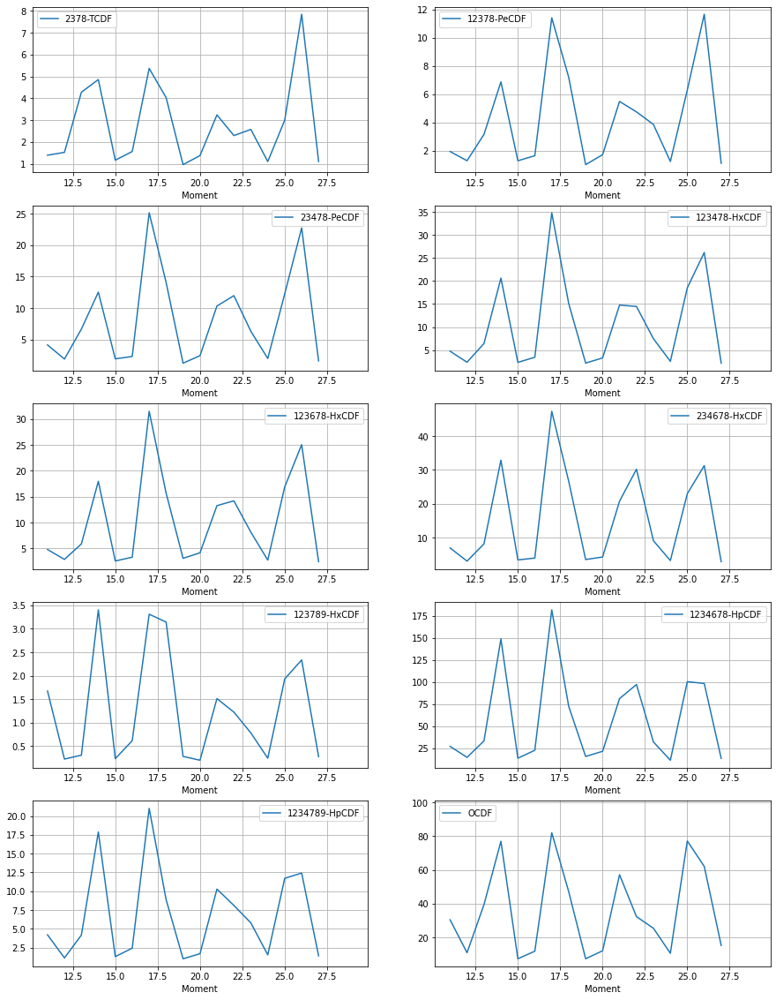

In [32]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==17].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# Site 14 :
Highest PCDF median

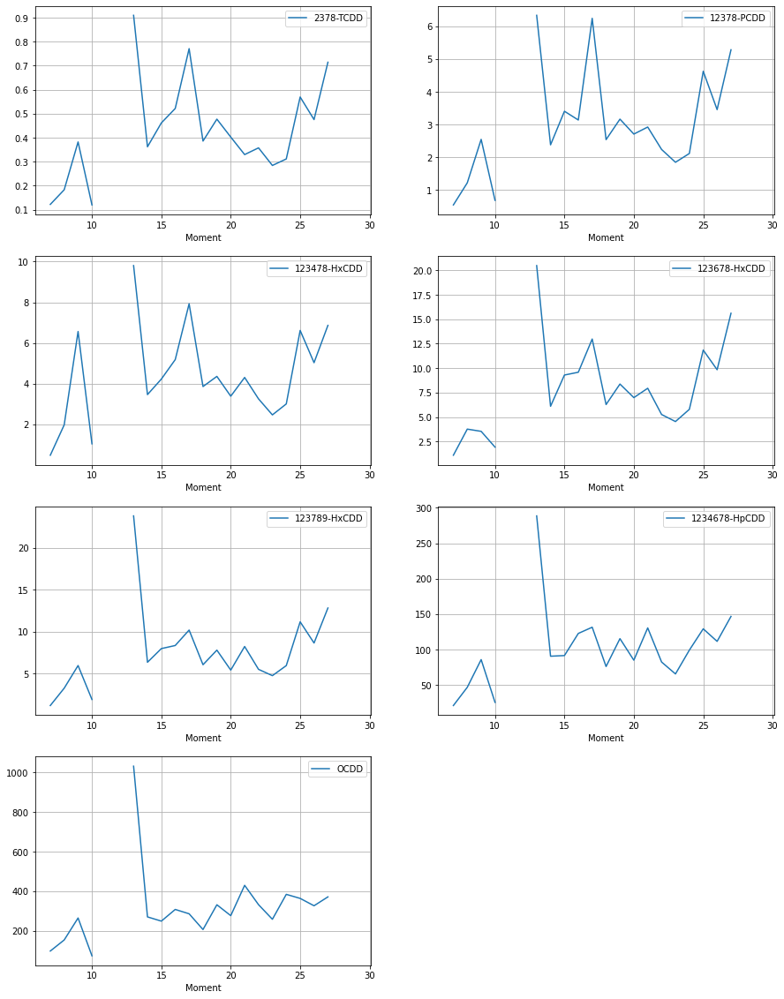

In [33]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==14].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

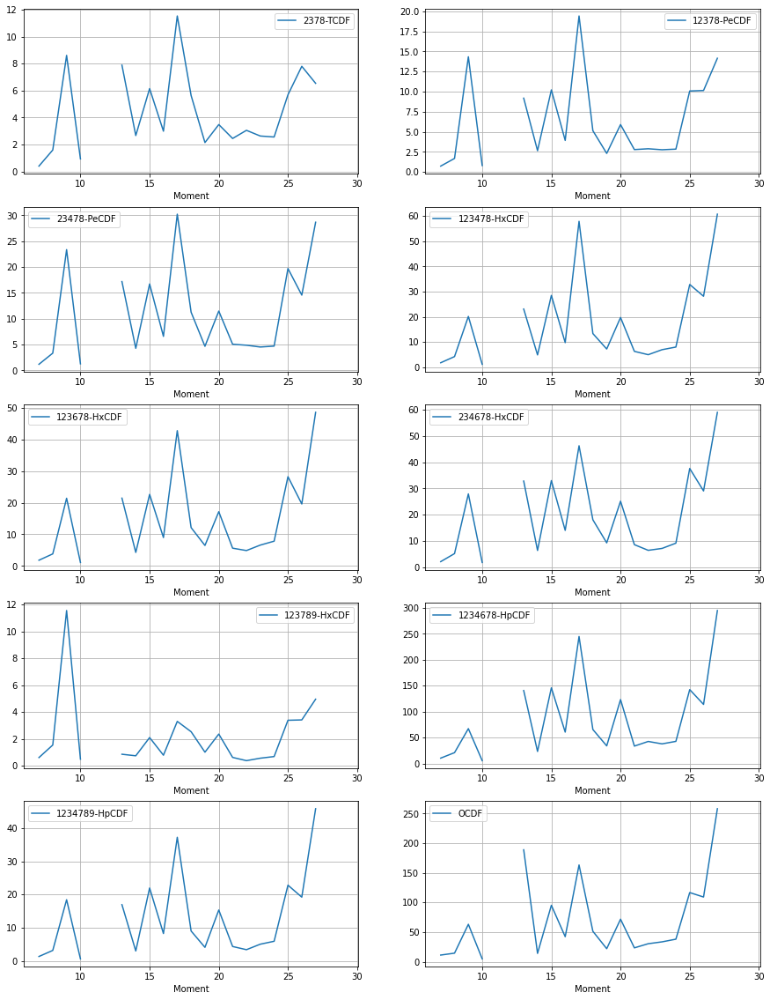

In [34]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==14
     ].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# Site 24 :
Lowest PCDF and PCDD median

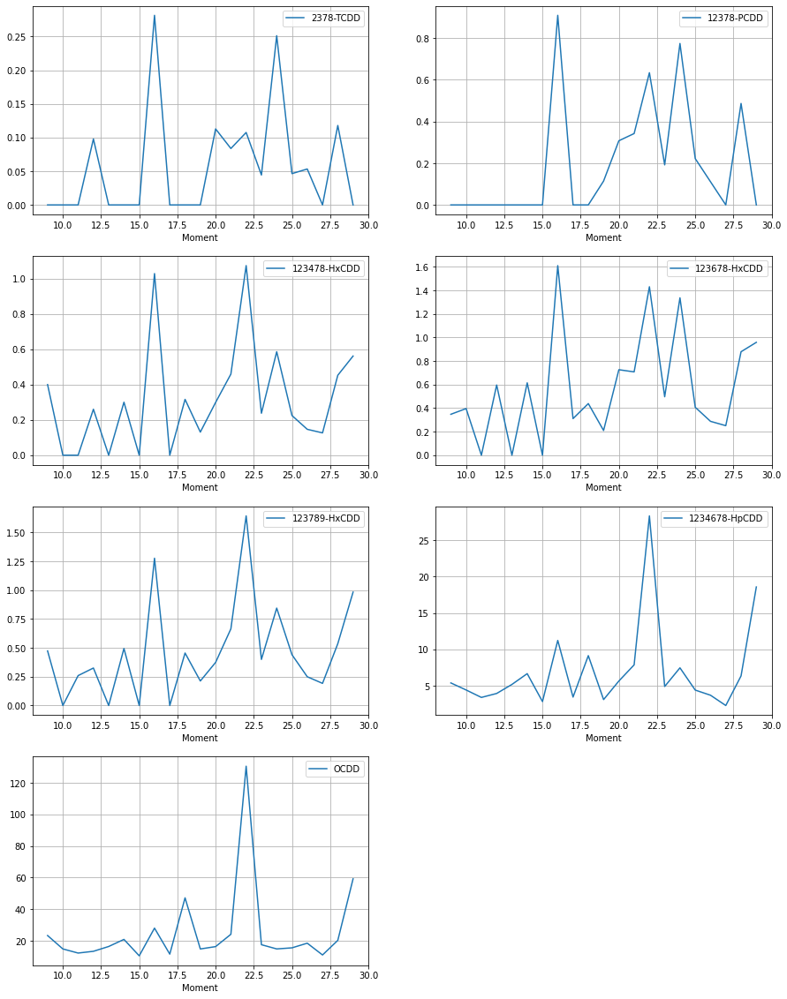

In [35]:
# PCDD
fig, axes = plt.subplots(nrows=4, ncols=2,figsize=(15,20))
ax = plt.subplot(4,2,8)
plt.delaxes(ax)

for i, P in enumerate(PCDD):
    ax = plt.subplot(4,2,i+1)
    df[df['Site #']==24].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

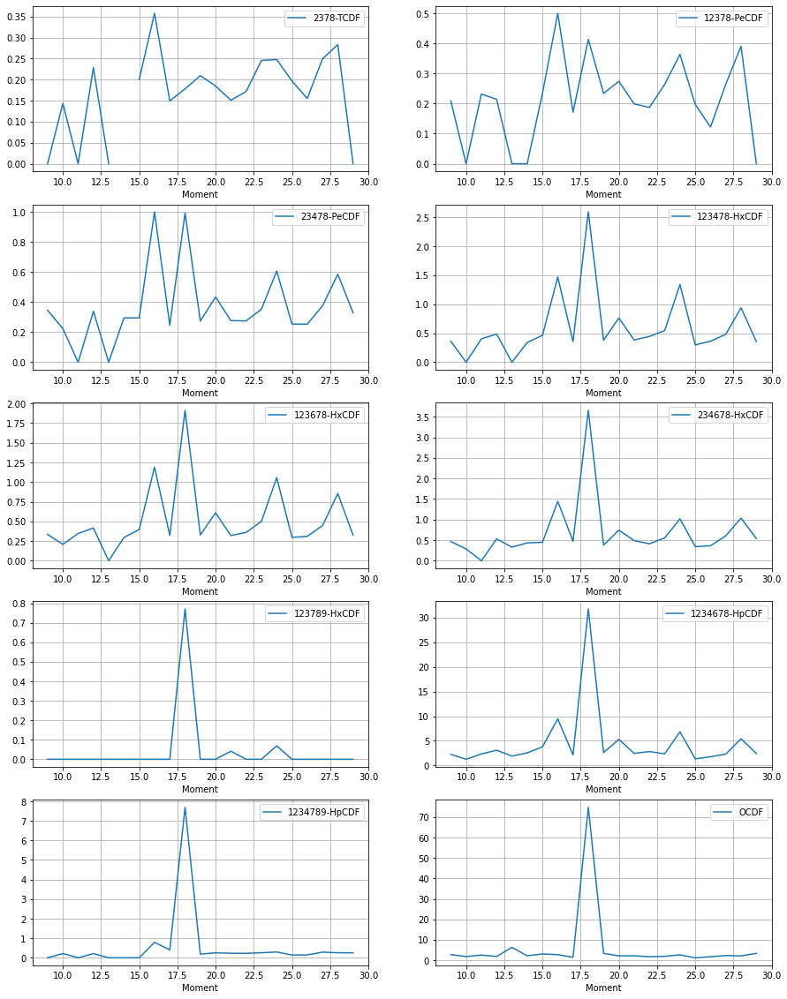

In [36]:
# PCDF
fig, axes = plt.subplots(nrows=5, ncols=2,figsize=(15,20))


for i, P in enumerate(PCDF):
    ax = plt.subplot(5,2,i+1)
    df[df['Site #']==24
     ].plot(x='Moment', y=P, ax=plt.gca())
    plt.grid()

# VI- Normalization methods
## 1 - Preparation
### 1.1- Data prep

In [37]:
df['Total_TCDD'] = df['2378-TCDD']
df['Total_PeCDD'] = df['12378-PCDD']
df['Total_HxCDD'] = df['123478-HxCDD'] + df['123678-HxCDD'] + df['123789-HxCDD']
df['Total_HpCDD'] = df['1234678-HpCDD']
df['Total_OCDD'] = df['OCDD']
df['Total_TCDF'] = df['2378-TCDF']
df['Total_PeCDF'] = df['12378-PeCDF'] + df['23478-PeCDF']
df['Total_HxCDF'] = df['123478-HxCDF'] + df['123678-HxCDF'] + df['234678-HxCDF'] + df['123789-HxCDF']
df['Total_HpCDF'] = df['1234678-HpCDF'] + df['1234789-HpCDF']
df['Total_OCDF'] = df['OCDF']

## 2- Methode A
### 2.1- Implementation on one sample

No handles with labels found to put in legend.


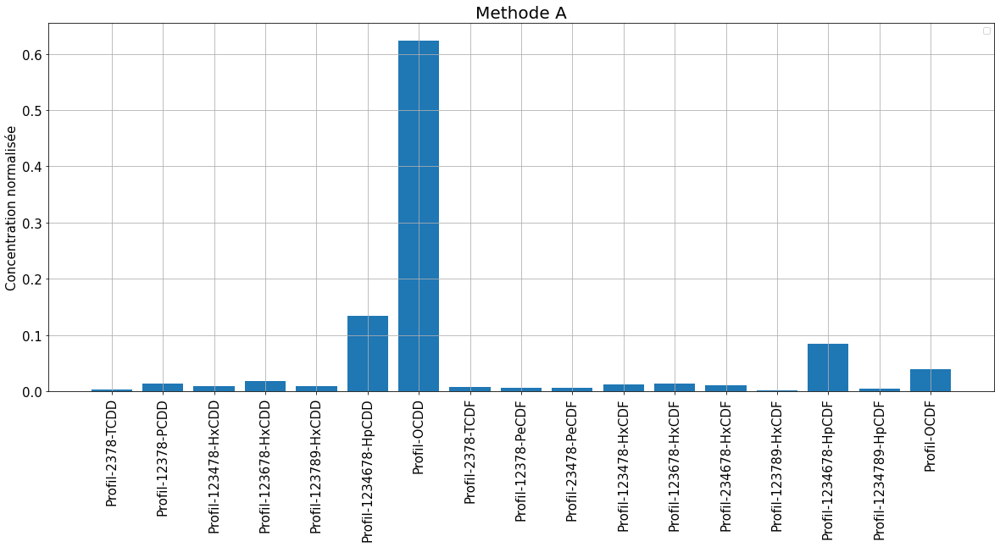

In [38]:
df_methodeA = df.copy()

congeneres = ['2378-TCDD', '12378-PCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', 'OCDD', '2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF', 'OCDF']

for i in congeneres:
    df_methodeA['Profil-'+i] = df_methodeA[i]/df['TOTAL']

plt.rcParams["figure.figsize"] = (20,8)
plt.bar(df_methodeA.columns[-17:], df_methodeA.values[0][-17:])

plt.title(f"Methode A",fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('Concentration normalisée',fontsize=15)
plt.xticks(fontsize=15,rotation=90)


plt.legend()
plt.grid()
plt.show()

### 2.2- Boxplot on all sites

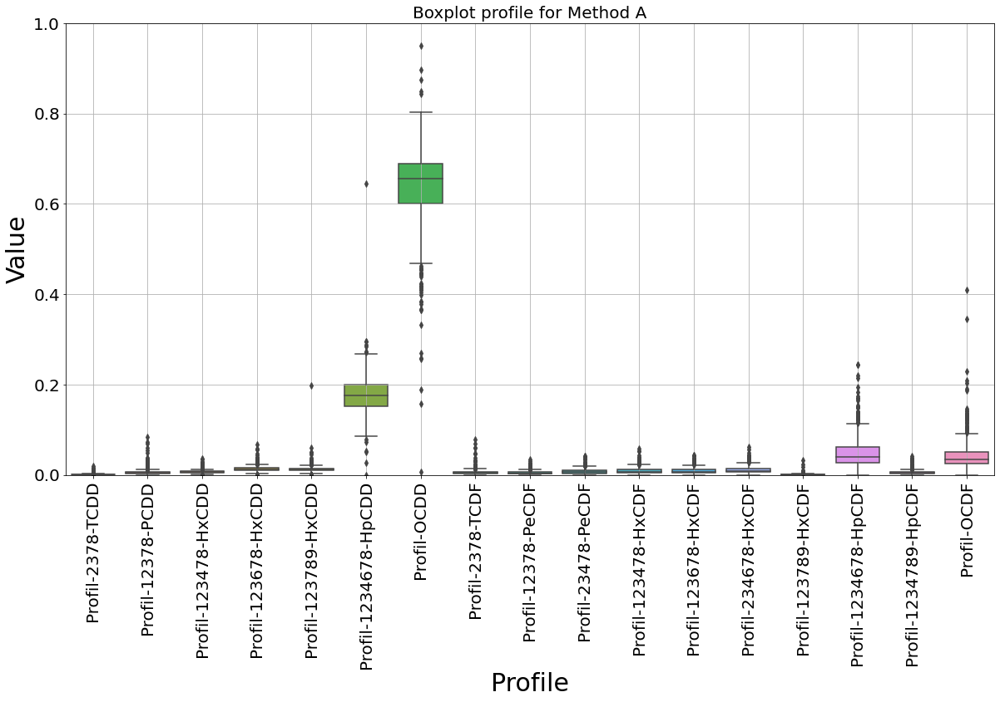

In [39]:
Profiles = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeA_boxplot = pd.DataFrame(columns=['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profile', 'Value'])

for i in range(736):
    for j,p in enumerate(Profiles):
        df_methodeA_boxplot.loc[i*len(Profiles)+j] = list(df_methodeA.values[i][:7]) + [p,df_methodeA.values[i][j+45]]
        
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeA_boxplot_ = df_methodeA_boxplot[df_methodeA_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


plt.figure(figsize = (20, 10))
plt.title("Boxplot profile for Method A",fontsize=20)
ax = sns.boxplot(x=X, y=Y, data=df_methodeA_boxplot_)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.xticks(fontsize = 20, rotation=90)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()

plt.show()

### 2.3- Vue by sites

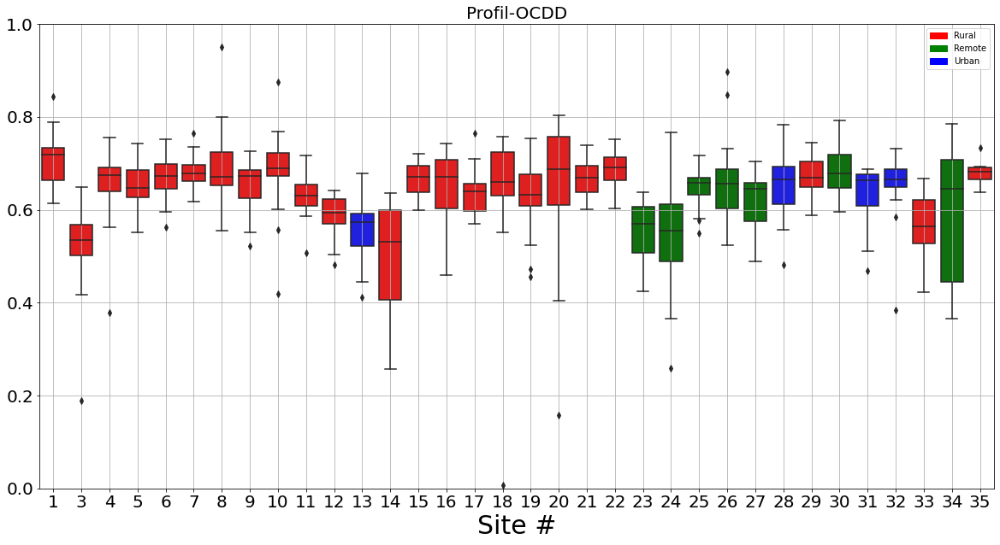

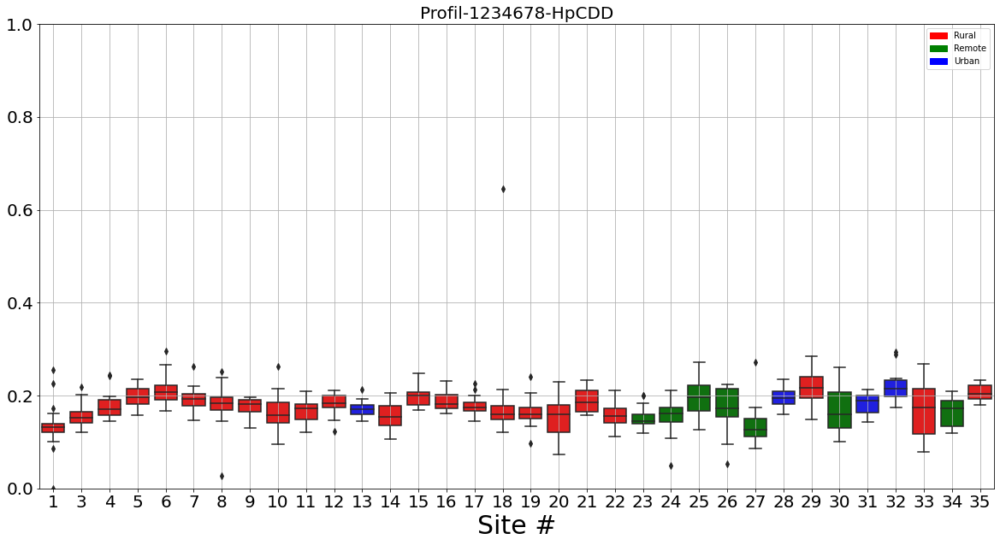

In [40]:
plt.figure(figsize = (20, 10))
plt.title("Profil-OCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeA_boxplot_[df_methodeA_boxplot_['Profile']=='Profil-OCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

plt.figure(figsize = (20, 10))
plt.title("Profil-1234678-HpCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeA_boxplot_[df_methodeA_boxplot_['Profile']=='Profil-1234678-HpCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 2.4 - Boxplot by type

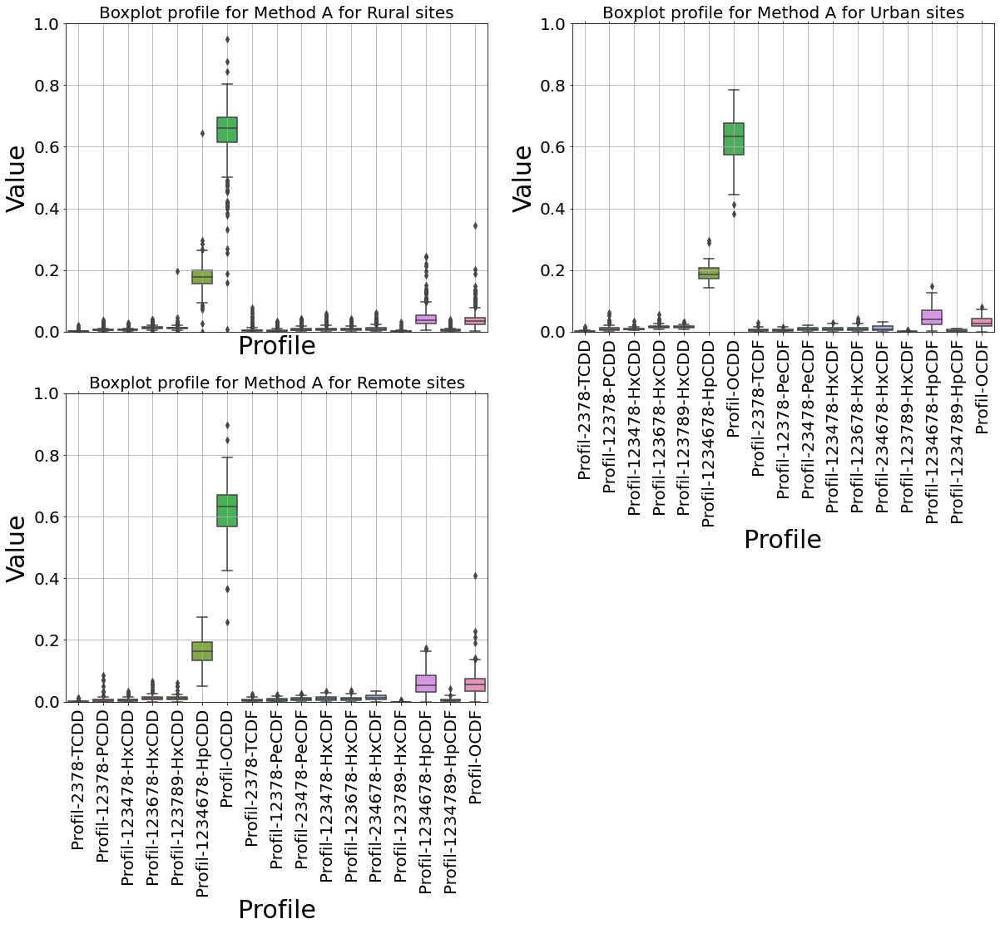

In [41]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeA_boxplot_ = df_methodeA_boxplot[df_methodeA_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Rural', 'Urban', 'Remote']):
    to_plot = df_methodeA_boxplot_[df_methodeA_boxplot_['Type']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method A for {i} sites",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3 or j==1:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 2.5 - Boxplot by season

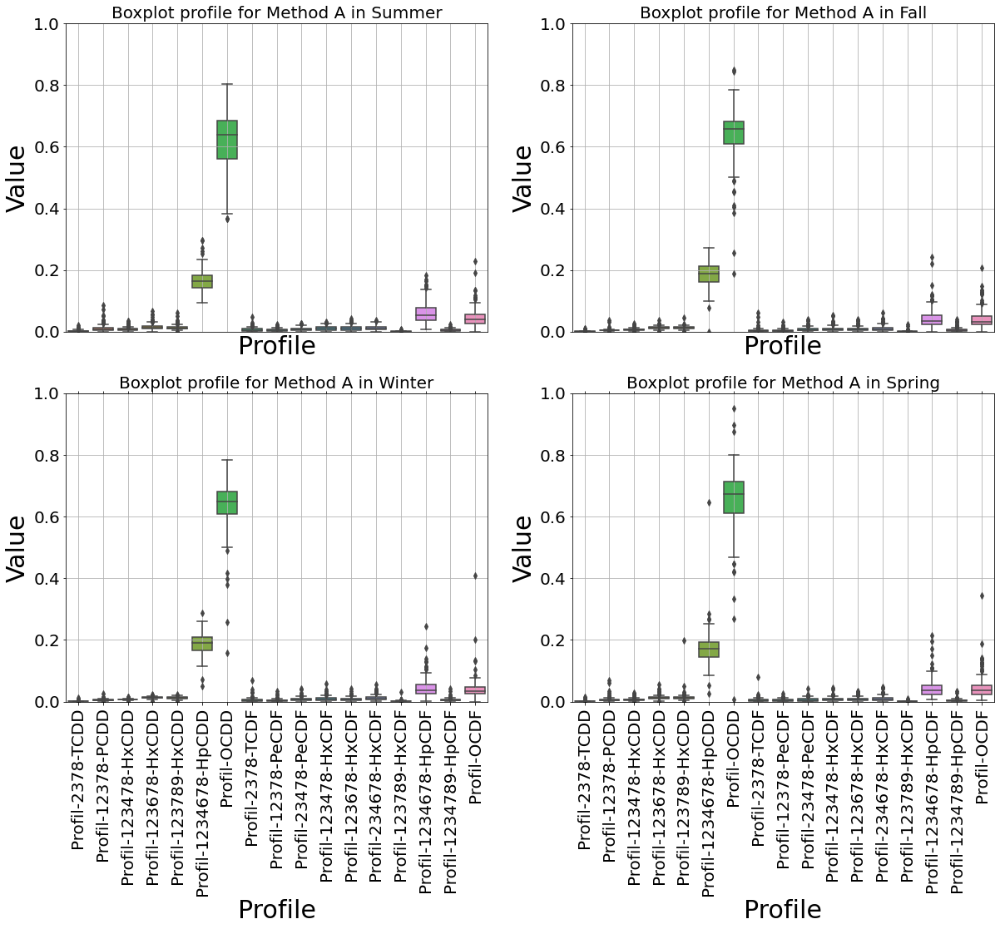

In [42]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeA_boxplot_ = df_methodeA_boxplot[df_methodeA_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeA_boxplot_[df_methodeA_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method A in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 2.6 - Boxplot by season and sites

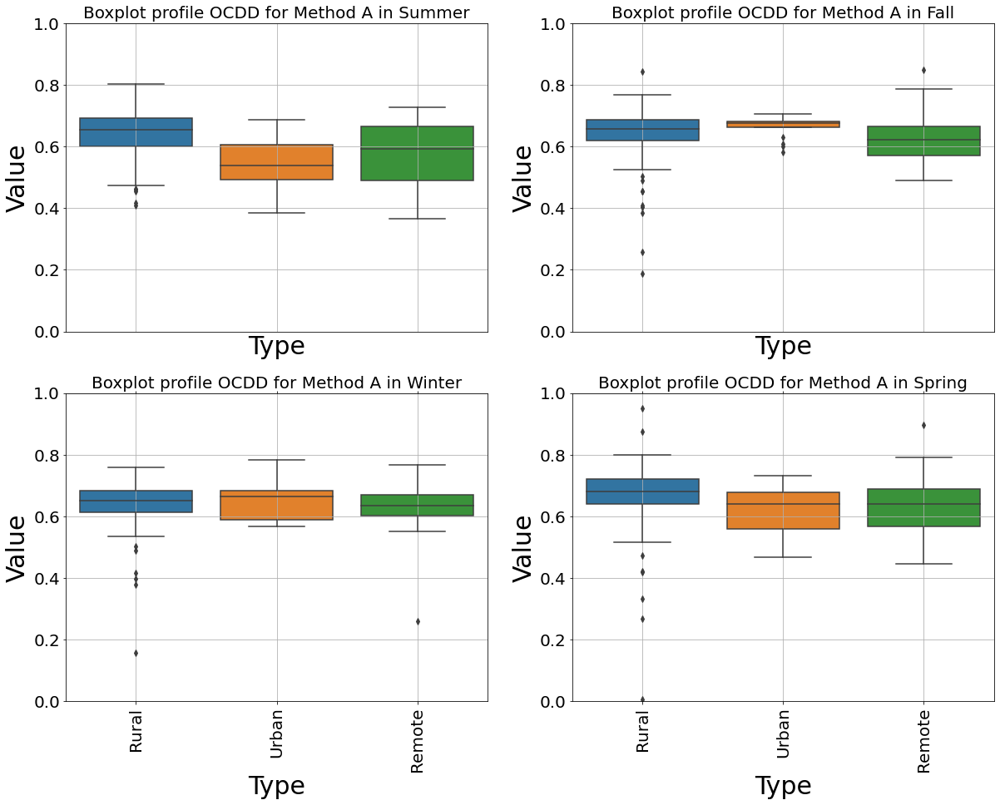

In [43]:
PRO = ['Profil-OCDD']
df_methodeA_boxplot_ = df_methodeA_boxplot[df_methodeA_boxplot['Profile'].isin(PRO)]
X='Type'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeA_boxplot_[df_methodeA_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile OCDD for Method A in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

## 3- Methode B
### 3.1- Implementation on one sample

No handles with labels found to put in legend.


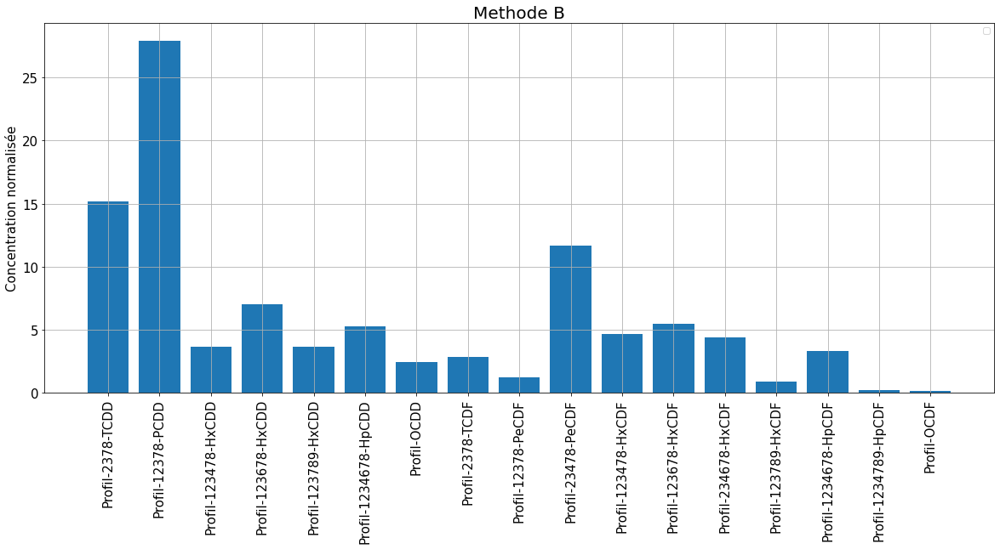

In [44]:
df_methodeB = df.copy()

congeneres_TEQ = [('2378-TCDD',1), ('12378-PCDD',0.5), ('123478-HxCDD',0.1), ('123678-HxCDD',0.1),
       ('123789-HxCDD',0.1), ('1234678-HpCDD',0.01), ('OCDD',0.001), ('2378-TCDF',0.1), ('12378-PeCDF',0.05),
       ('23478-PeCDF',0.5), ('123478-HxCDF',0.1), ('123678-HxCDF',0.1), ('234678-HxCDF',0.1),
       ('123789-HxCDF',0.1), ('1234678-HpCDF',0.01), ('1234789-HpCDF',0.01), ('OCDF',0.001)]


df_methodeB['Total-TEQ'] = 0
for i in congeneres_TEQ:
    df_methodeB['Total-TEQ'] = df_methodeB['Total-TEQ'] + df_methodeB[i[0]]*i[1]
    
for i in congeneres_TEQ:
    df_methodeB['Profil-'+i[0]] = 100*(df_methodeB[i[0]]*i[1])/df_methodeB['Total-TEQ']

plt.bar(df_methodeB.columns[-17:], df_methodeB.values[0][-17:])

plt.title(f"Methode B",fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('Concentration normalisée',fontsize=15)
plt.xticks(fontsize=15,rotation=90)
plt.rcParams["figure.figsize"] = (20,8)

plt.legend()
plt.grid()
plt.show()

### 3.2 - Boxplot of all sites

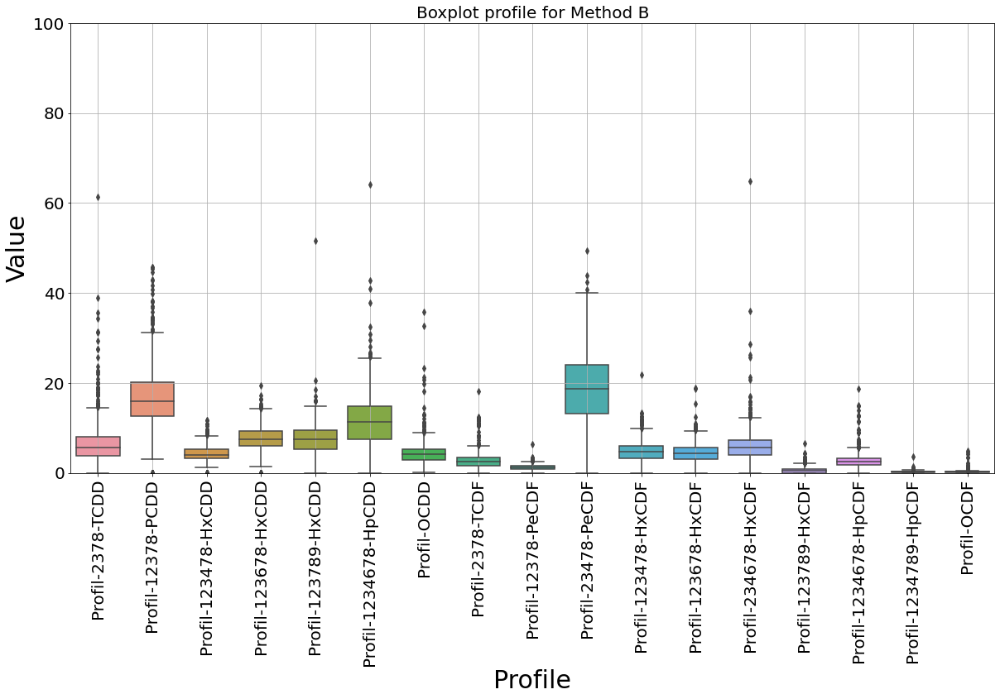

In [45]:
Profiles = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeB_boxplot = pd.DataFrame(columns=['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profile', 'Value'])


for i in range(736):
    for j,p in enumerate(Profiles):
        df_methodeB_boxplot.loc[i*len(Profiles)+j] = list(df_methodeB.values[i][:7]) + [p,df_methodeB.values[i][j+46]]

PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeB_boxplot_ = df_methodeB_boxplot[df_methodeB_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


plt.figure(figsize = (20, 10))
plt.title("Boxplot profile for Method B",fontsize=20)
ax = sns.boxplot(x=X, y=Y, data=df_methodeB_boxplot_)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.xticks(fontsize = 20, rotation=90)
plt.yticks(fontsize = 20)
plt.ylim(0,100)
plt.grid()

plt.show()

### 3.3 - Vue by site

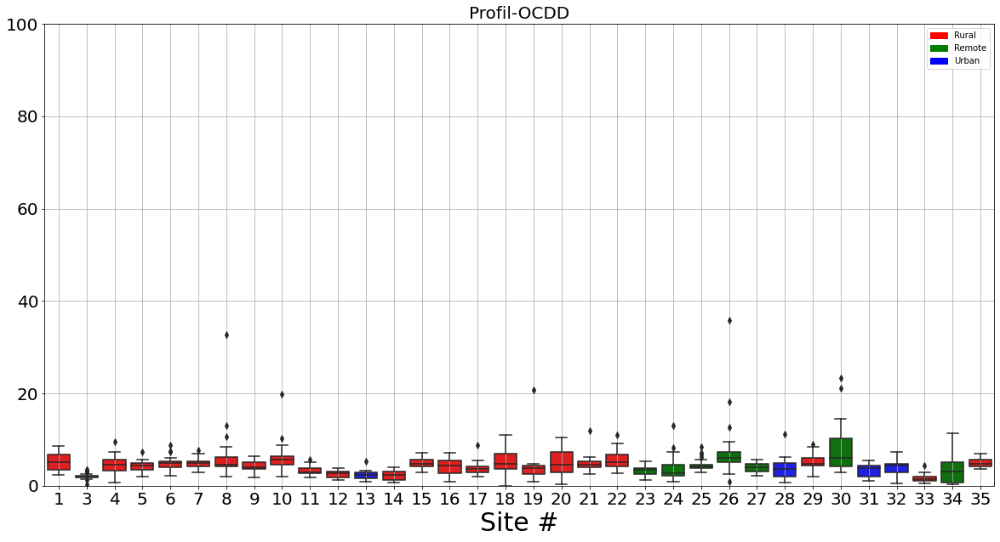

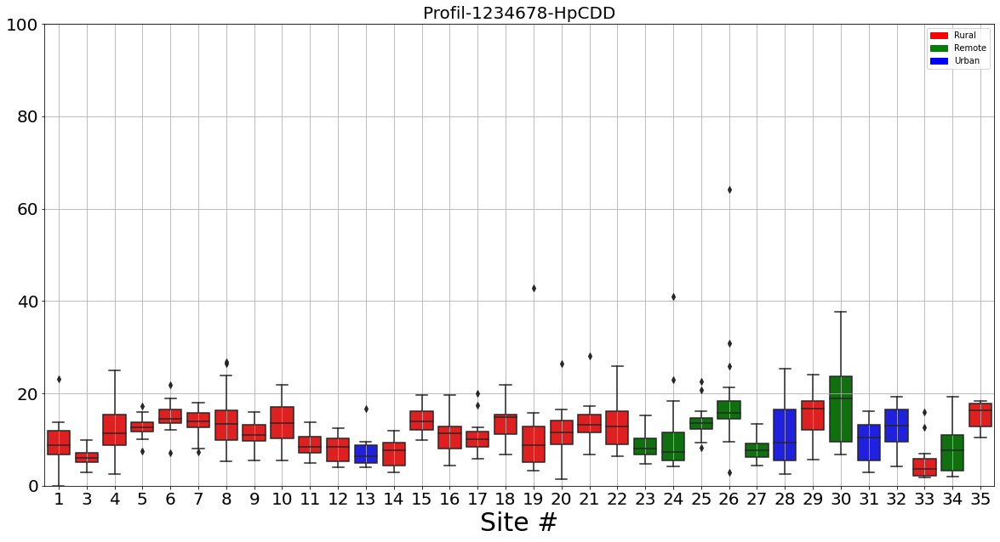

In [46]:
plt.figure(figsize = (20, 10))
plt.title("Profil-OCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeB_boxplot_[df_methodeB_boxplot_['Profile']=='Profil-OCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,100)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

plt.figure(figsize = (20, 10))
plt.title("Profil-1234678-HpCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeB_boxplot_[df_methodeB_boxplot_['Profile']=='Profil-1234678-HpCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,100)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 3.4 - Boxplot by type

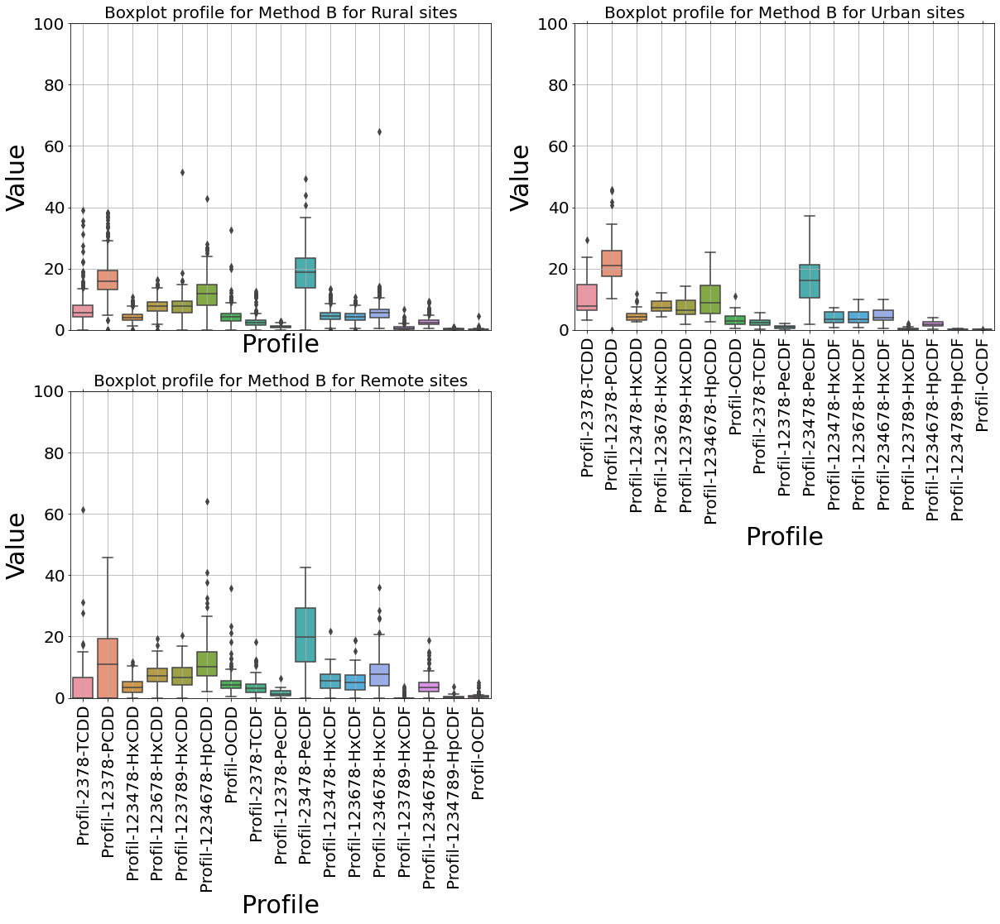

In [47]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeB_boxplot_ = df_methodeB_boxplot[df_methodeB_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'

f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Rural', 'Urban', 'Remote']):
    to_plot = df_methodeB_boxplot_[df_methodeB_boxplot_['Type']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method B for {i} sites",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3 or j==1:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,100)
    plt.grid()

plt.show()

### 3.5 - Boxplot by season

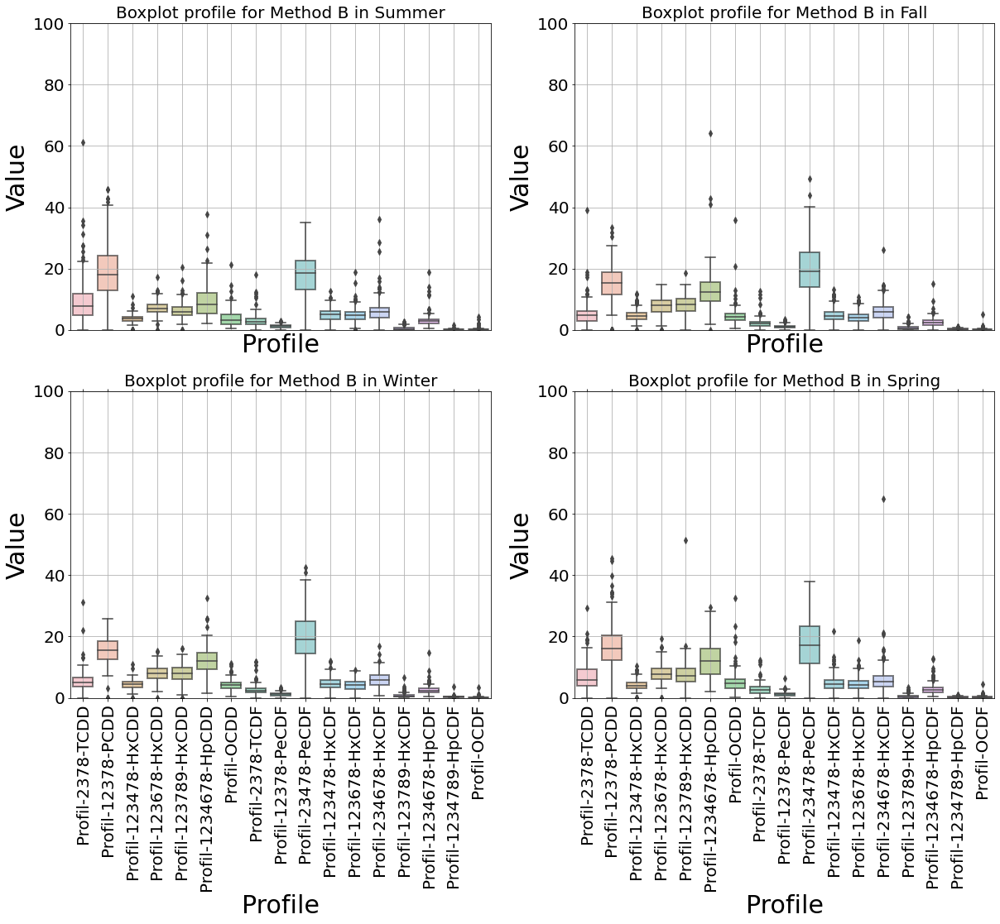

In [48]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeB_boxplot_ = df_methodeB_boxplot[df_methodeB_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeB_boxplot_[df_methodeB_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method B in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,100)
    plt.grid()

plt.show()

### 3.6 - Boxplot by season and sites

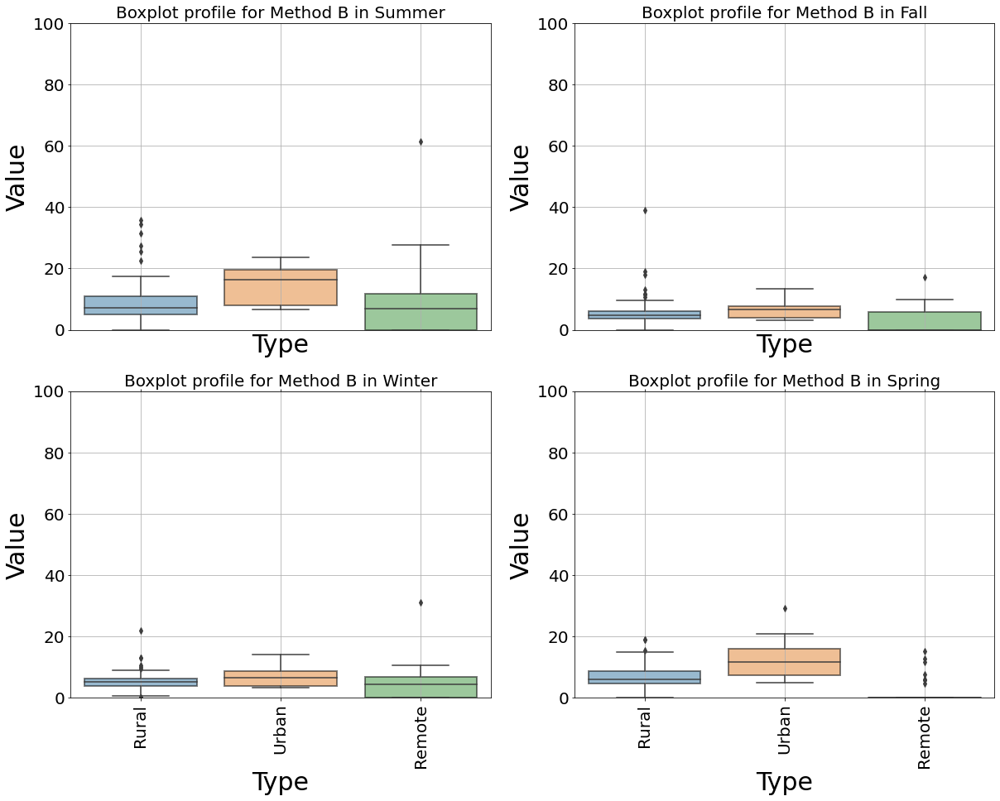

In [49]:
PRO = ['Profil-2378-TCDD']
df_methodeB_boxplot_ = df_methodeB_boxplot[df_methodeB_boxplot['Profile'].isin(PRO)]
X='Type'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeB_boxplot_[df_methodeB_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method B in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,100)
    plt.grid()

plt.show()

## 4- Methode C
### 4.1 - Implementation on one sample

No handles with labels found to put in legend.


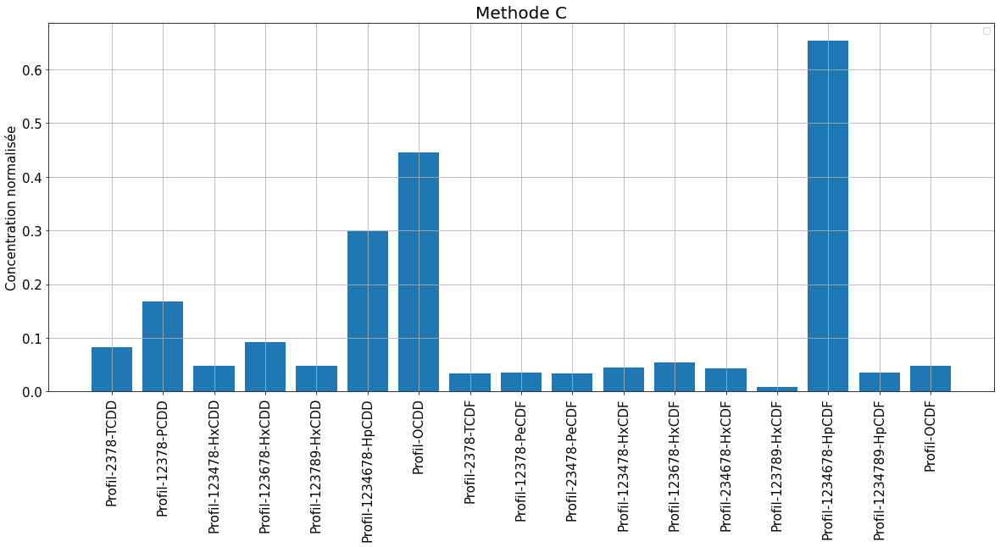

In [50]:
total_list = ['Total TCDF', 'Total TCDD', 'Total PeCDF', 'Total PeCDD', 'Total HxCDF', 'Total HxCDD', 'Total HpCDF', 'Total HpCDD']
df_methodeC = df.copy()
Total = ['Total TCDD','Total PeCDD','Total HxCDD','Total HpCDD','OCDD',
         'Total TCDF','Total PeCDF','Total HxCDF','Total HpCDF','OCDF']

congeneres = ['2378-TCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', '2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF']
for total in total_list:
    df_methodeC = df_methodeC[df_methodeC[total] > 0]
for i in congeneres:
    tot = [j for j in Total if j[-4:]==i[-4:]][0]
    df_methodeC = df_methodeC[df_methodeC[i] < df_methodeC[tot]]



df_methodeC['TOTAL PCDD'] = df_methodeC['Total TCDD']+df_methodeC['Total PeCDD']+df_methodeC['Total HxCDD']+df_methodeC['Total HpCDD']+df_methodeC['OCDD']
df_methodeC['TOTAL PCDF'] = df_methodeC['Total TCDF']+df_methodeC['Total PeCDF']+df_methodeC['Total HxCDF']+df_methodeC['Total HpCDF']+df_methodeC['OCDF'] 

df_methodeC['Profil-12378-PCDD'] = df_methodeC['12378-PCDD']/df_methodeC['Total PeCDD']
df_methodeC['Profil-OCDD'] = df_methodeC['OCDD']/df_methodeC['TOTAL PCDD']
df_methodeC['Profil-OCDF'] = df_methodeC['OCDF']/df_methodeC['TOTAL PCDF']

for i in congeneres:
    tot = [j for j in Total if j[-4:]==i[-4:]][0]
    df_methodeC['Profil-'+i] = df_methodeC[i]/df_methodeC[tot]

df_ordered = df_methodeC[['Profil-2378-TCDD', 'Profil-12378-PCDD', 'Profil-123478-HxCDD',
       'Profil-123678-HxCDD', 'Profil-123789-HxCDD', 'Profil-1234678-HpCDD',
       'Profil-OCDD', 'Profil-2378-TCDF', 'Profil-12378-PeCDF',
       'Profil-23478-PeCDF', 'Profil-123478-HxCDF', 'Profil-123678-HxCDF',
       'Profil-234678-HxCDF', 'Profil-123789-HxCDF', 'Profil-1234678-HpCDF',
       'Profil-1234789-HpCDF', 'Profil-OCDF']]

plt.bar(df_ordered.columns, df_ordered.values[0])

plt.title(f"Methode C",fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('Concentration normalisée',fontsize=15)
plt.xticks(fontsize=15,rotation=90)
plt.rcParams["figure.figsize"] = (20,8)

plt.legend()
plt.grid()
plt.show()

### 4.2 - Boxplot of all sites

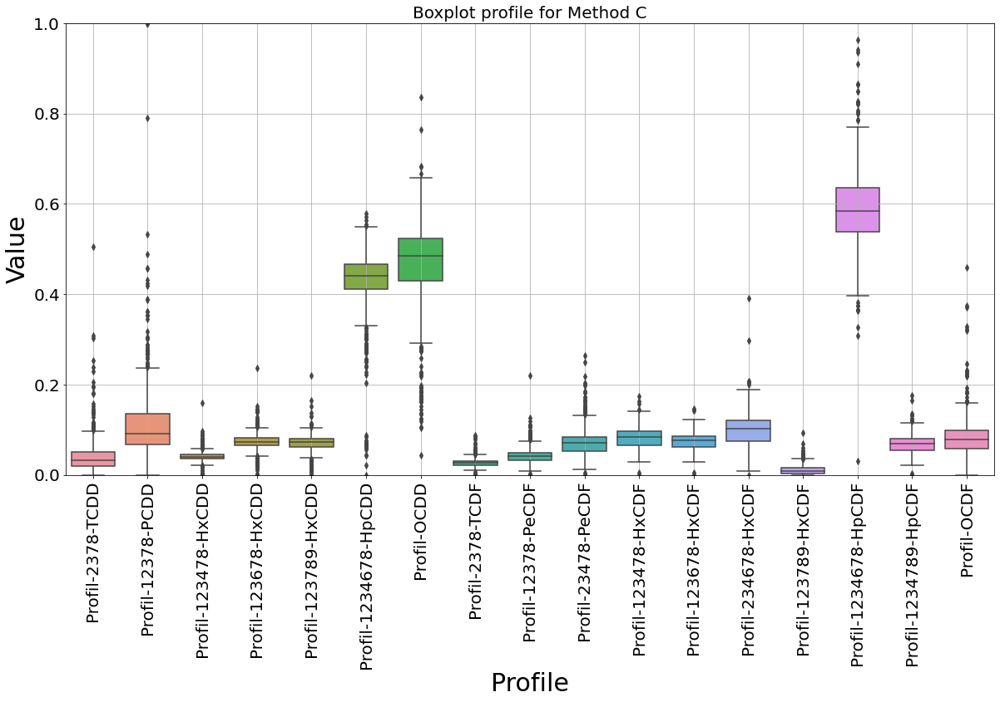

In [51]:
df_ordered_all = df_methodeC[['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profil-2378-TCDD', 'Profil-12378-PCDD', 'Profil-123478-HxCDD',
       'Profil-123678-HxCDD', 'Profil-123789-HxCDD', 'Profil-1234678-HpCDD',
       'Profil-OCDD', 'Profil-2378-TCDF', 'Profil-12378-PeCDF',
       'Profil-23478-PeCDF', 'Profil-123478-HxCDF', 'Profil-123678-HxCDF',
       'Profil-234678-HxCDF', 'Profil-123789-HxCDF', 'Profil-1234678-HpCDF',
       'Profil-1234789-HpCDF', 'Profil-OCDF']]

Profiles = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeC_boxplot = pd.DataFrame(columns=['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profile', 'Value'])


for i in range(len(df_methodeC)):
    for j,p in enumerate(Profiles):
        df_methodeC_boxplot.loc[i*17+j] = list(df_ordered_all.values[i][:7]) + [p,df_ordered_all.values[i][j+7]]
        
        
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeC_boxplot_ = df_methodeC_boxplot[df_methodeC_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


plt.figure(figsize = (20, 10))
plt.title("Boxplot profile for Method C",fontsize=20)
ax = sns.boxplot(x=X, y=Y, data=df_methodeC_boxplot_)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.xticks(fontsize = 20, rotation=90)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()

plt.show()

### 4.4- Vue by site

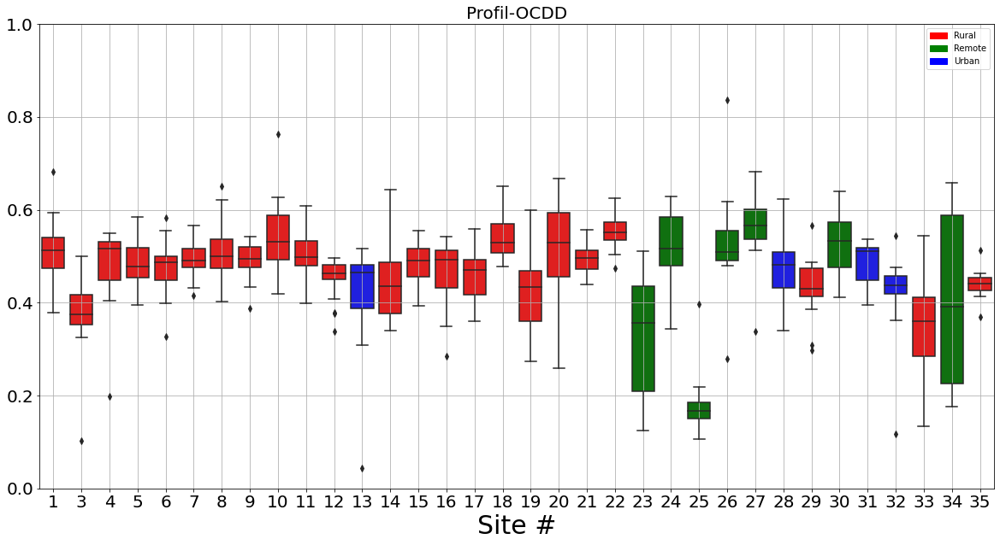

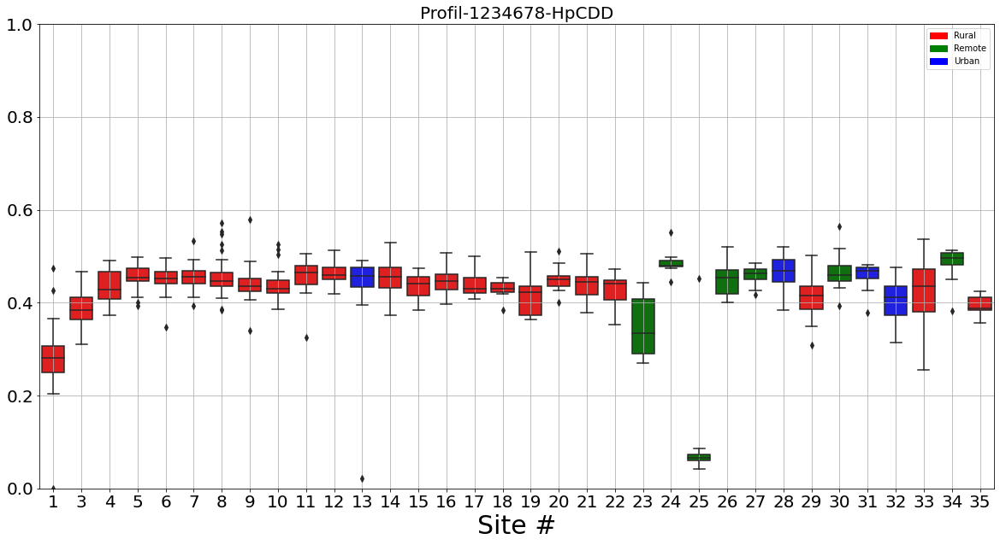

In [52]:
plt.figure(figsize = (20, 10))
plt.title("Profil-OCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeC_boxplot_[df_methodeC_boxplot_['Profile']=='Profil-OCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

plt.figure(figsize = (20, 10))
plt.title("Profil-1234678-HpCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeC_boxplot_[df_methodeC_boxplot_['Profile']=='Profil-1234678-HpCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 4.5 - Boxplot by type

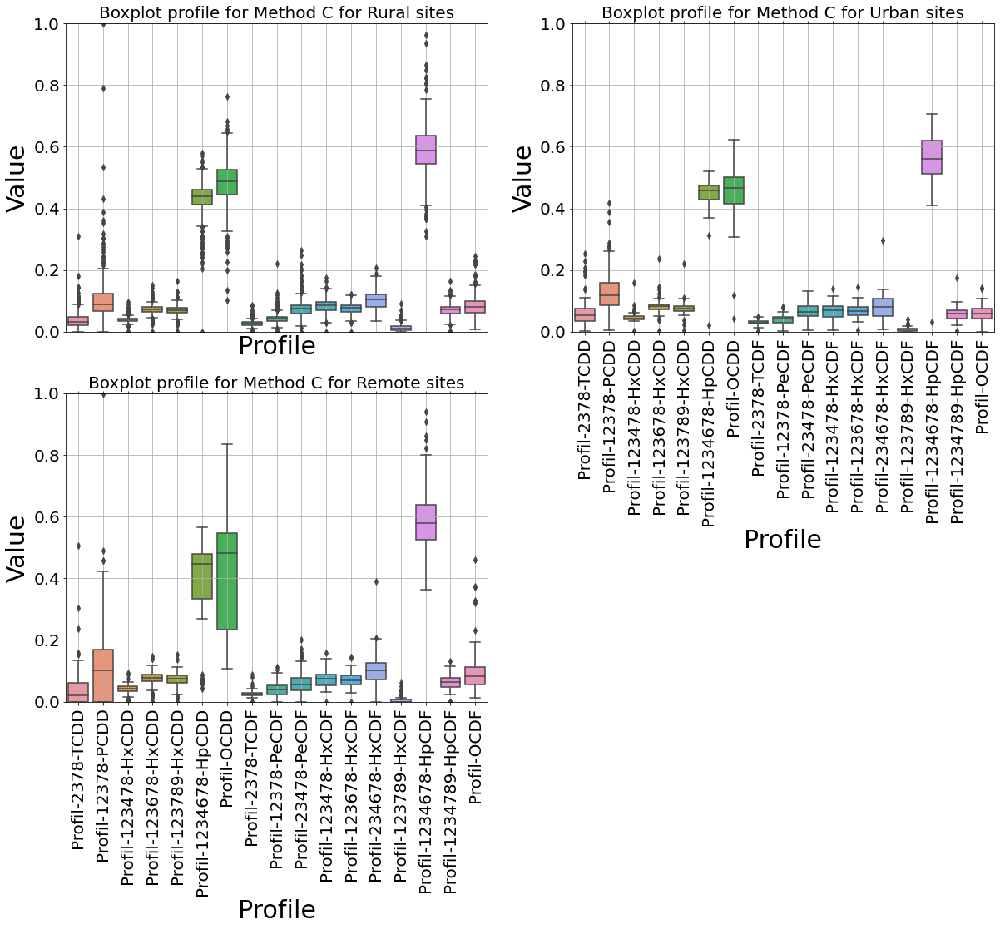

In [53]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeC_boxplot_ = df_methodeC_boxplot[df_methodeC_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'

f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Rural', 'Urban', 'Remote']):
    to_plot = df_methodeC_boxplot_[df_methodeC_boxplot_['Type']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method C for {i} sites",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3 or j==1:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 4.6 - Boxplot by season

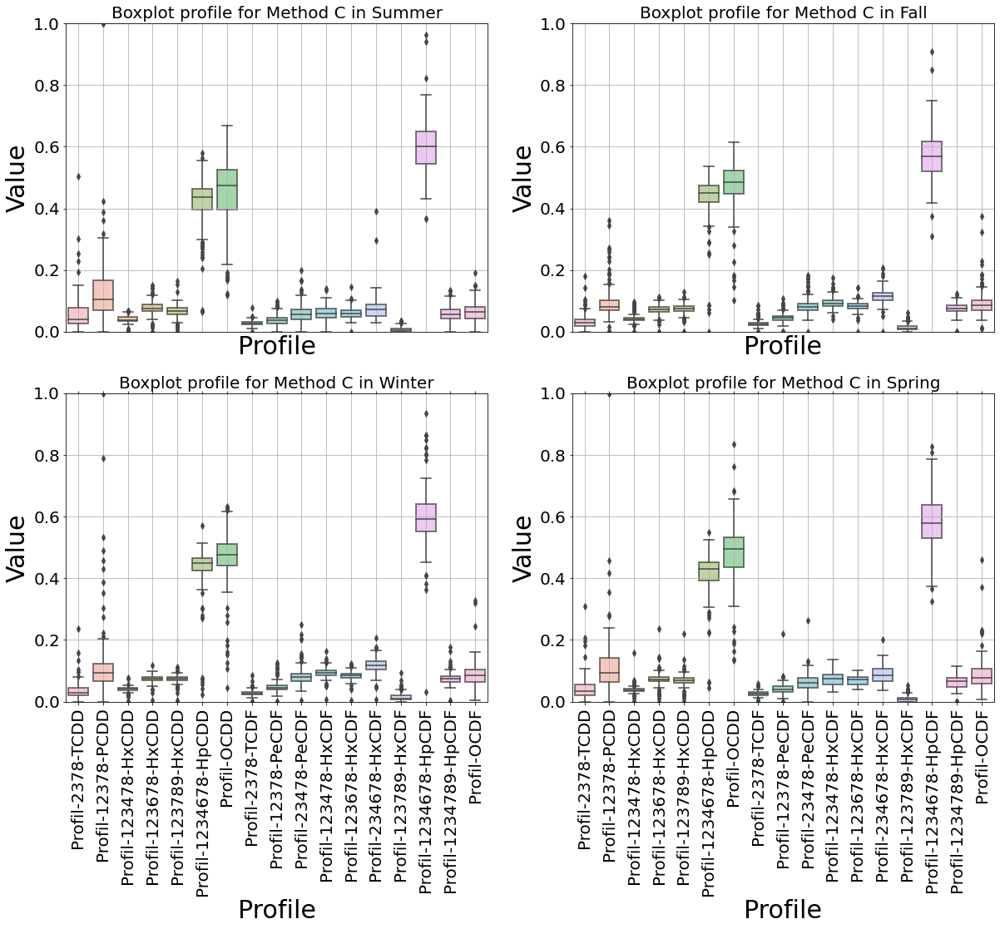

In [54]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeC_boxplot_ = df_methodeC_boxplot[df_methodeC_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeC_boxplot_[df_methodeC_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method C in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 4.6 - Boxplot by season and site

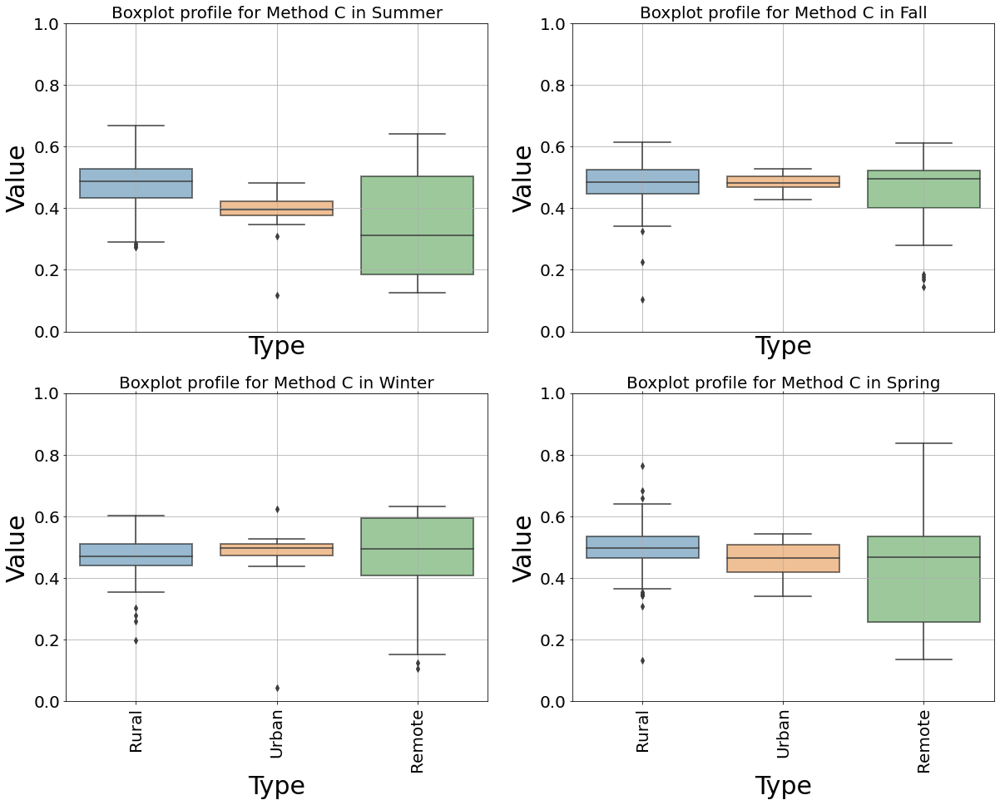

In [55]:
PRO = ['Profil-OCDD']
df_methodeC_boxplot_ = df_methodeC_boxplot[df_methodeC_boxplot['Profile'].isin(PRO)]
X='Type'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeC_boxplot_[df_methodeC_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method C in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

## 5- Methode D
### 5.1 - Implementation on one sample

No handles with labels found to put in legend.


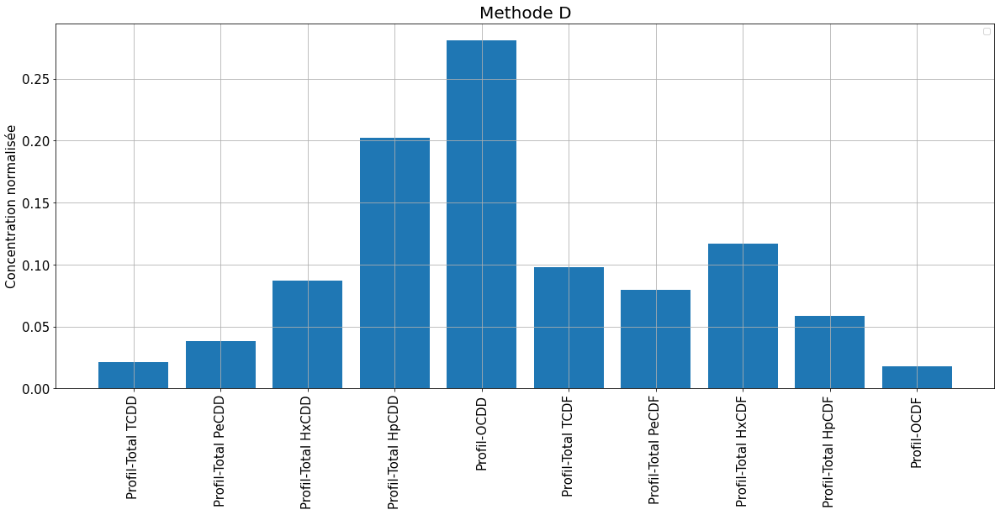

In [56]:
df_methodeD = df.copy()
for total in total_list:
    df_methodeD = df_methodeD[df_methodeD[total] > 0]
for i in congeneres:
    tot = [j for j in Total if j[-4:]==i[-4:]][0]
    df_methodeD = df_methodeD[df_methodeD[i] < df_methodeD[tot]]

Homologues = ['Total TCDD', 'Total PeCDD', 'Total HxCDD', 'Total HpCDD', 'OCDD',
              'Total TCDF', 'Total PeCDF', 'Total HxCDF', 'Total HpCDF', 'OCDF']


df_methodeD['TOTAL Global'] = df_methodeD['Total TCDD']+df_methodeD['Total PeCDD']+df_methodeD['Total HxCDD']+df_methodeD['Total HpCDD']+df_methodeD['OCDD']+ \
                              df_methodeD['Total TCDF']+df_methodeD['Total PeCDF']+df_methodeD['Total HxCDF']+df_methodeD['Total HpCDF']+df_methodeD['OCDF'] 


for hom in Homologues:
    df_methodeD['Profil-'+hom] = df_methodeD[hom]/df_methodeD['TOTAL Global']

plt.rcParams["figure.figsize"] = (20,8)
plt.bar(df_methodeD.columns[-10:], df_methodeD.values[0][-10:])

plt.title(f"Methode D",fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('Concentration normalisée',fontsize=15)
plt.xticks(fontsize=15,rotation=90)


plt.legend()
plt.grid()
plt.show()

### 5.2 - Boxplot of all sites

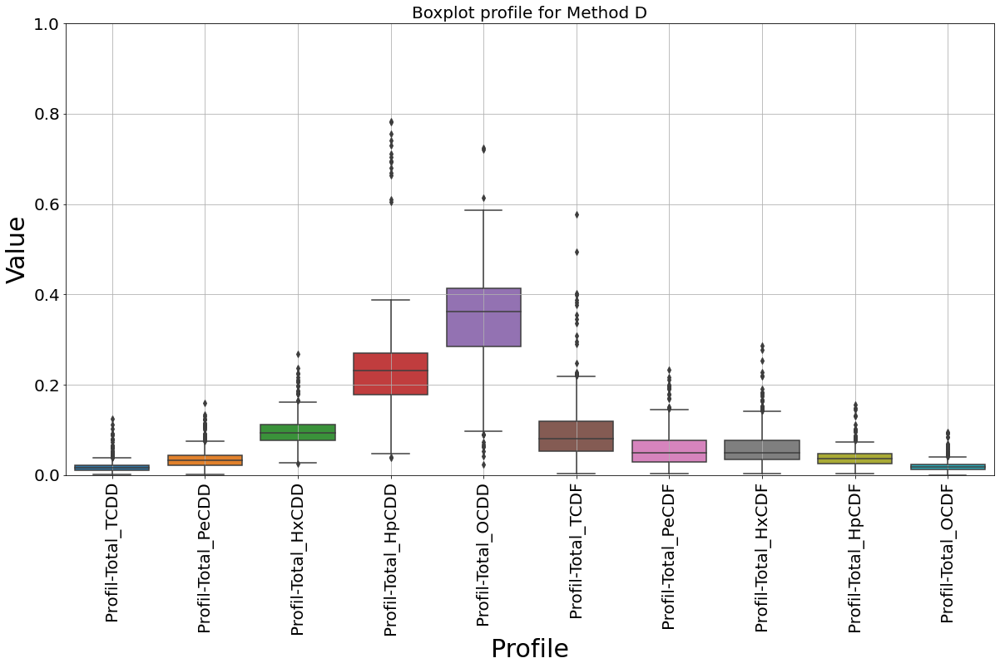

In [57]:
Profiles_hom = ['Profil-Total_TCDD' , 'Profil-Total_PeCDD' , 
       'Profil-Total_HxCDD' , 'Profil-Total_HpCDD' , 'Profil-Total_OCDD' , 'Profil-Total_TCDF' , 
       'Profil-Total_PeCDF' , 'Profil-Total_HxCDF' , 'Profil-Total_HpCDF' , 'Profil-Total_OCDF']
df_methodeD_boxplot = pd.DataFrame(columns=['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profile', 'Value'])


for i in range(len(df_methodeD)):
    for j,p in enumerate(Profiles_hom):
        df_methodeD_boxplot.loc[i*len(Profiles_hom)+j] = list(df_methodeD.values[i][:7]) + [p,df_methodeD.values[i][j+46]]

PRO_hom = ['Profil-Total_TCDD' , 'Profil-Total_PeCDD' , 
       'Profil-Total_HxCDD' , 'Profil-Total_HpCDD' , 'Profil-Total_OCDD' , 'Profil-Total_TCDF' , 
       'Profil-Total_PeCDF' , 'Profil-Total_HxCDF' , 'Profil-Total_HpCDF' , 'Profil-Total_OCDF']
df_methodeD_boxplot_ = df_methodeD_boxplot[df_methodeD_boxplot['Profile'].isin(PRO_hom)]
X='Profile'
Y='Value'


plt.figure(figsize = (20, 10))
plt.title("Boxplot profile for Method D",fontsize=20)
ax = sns.boxplot(x=X, y=Y, data=df_methodeD_boxplot_)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.xticks(fontsize = 20, rotation=90)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()

plt.show()

### 5.3- Vue by site

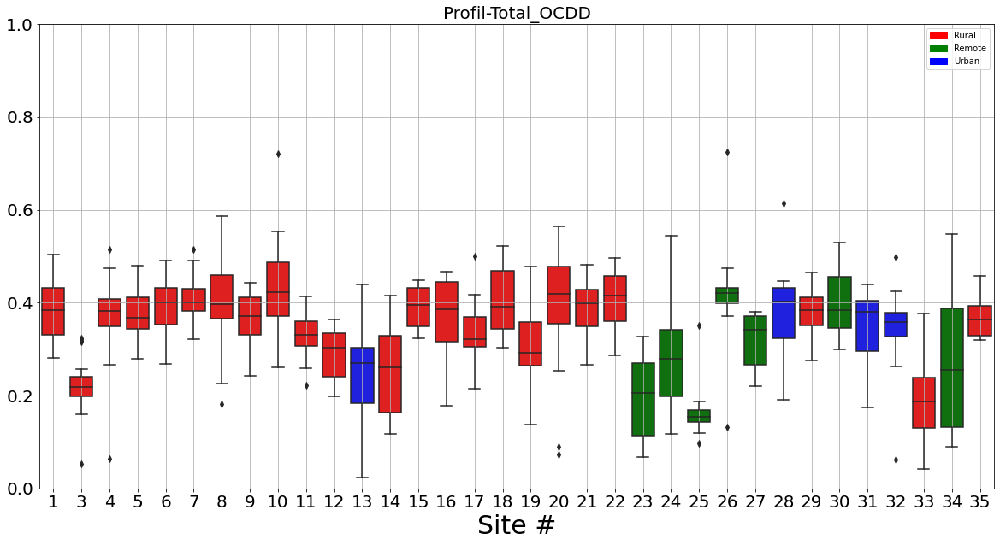

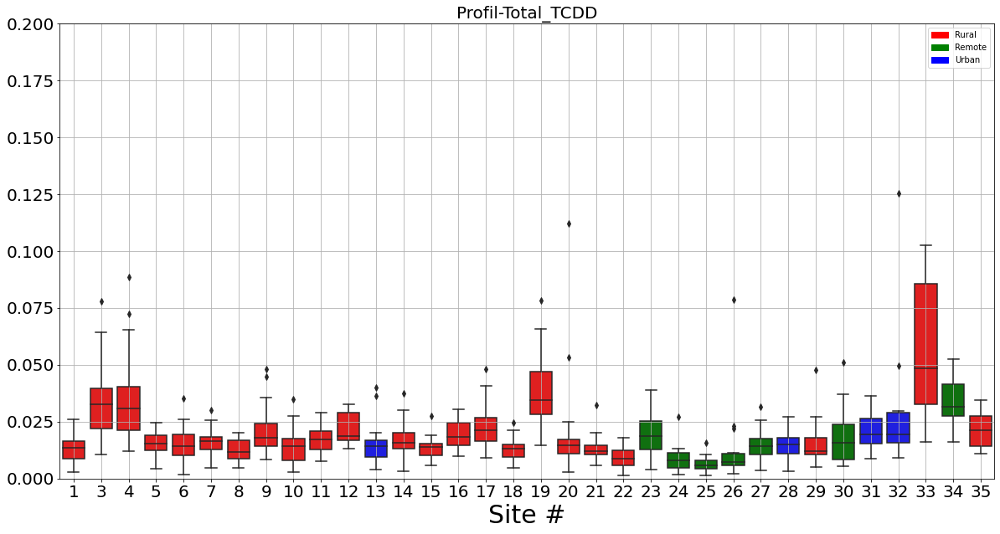

In [58]:
plt.figure(figsize = (20, 10))
plt.title("Profil-Total_OCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeD_boxplot_[df_methodeD_boxplot_['Profile']=='Profil-Total_OCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

plt.figure(figsize = (20, 10))
plt.title("Profil-Total_TCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeD_boxplot_[df_methodeD_boxplot_['Profile']=='Profil-Total_TCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,0.2)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 5.4 - Boxplot by type

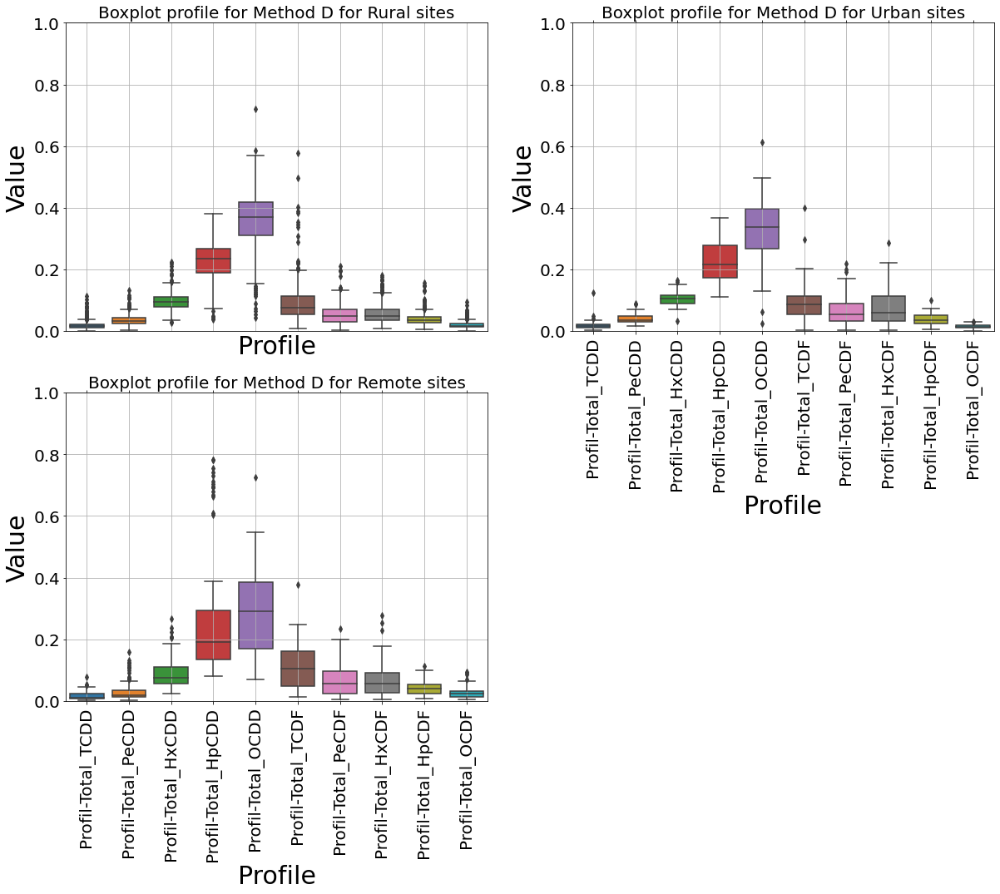

In [59]:
PRO_hom = ['Profil-Total_TCDD' , 'Profil-Total_PeCDD' , 
       'Profil-Total_HxCDD' , 'Profil-Total_HpCDD' , 'Profil-Total_OCDD' , 'Profil-Total_TCDF' , 
       'Profil-Total_PeCDF' , 'Profil-Total_HxCDF' , 'Profil-Total_HpCDF' , 'Profil-Total_OCDF']
df_methodeD_boxplot_ = df_methodeD_boxplot[df_methodeD_boxplot['Profile'].isin(PRO_hom)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Rural', 'Urban', 'Remote']):
    to_plot = df_methodeD_boxplot_[df_methodeD_boxplot_['Type']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method D for {i} sites",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3 or j==1:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 5.5 - Boxplot by season

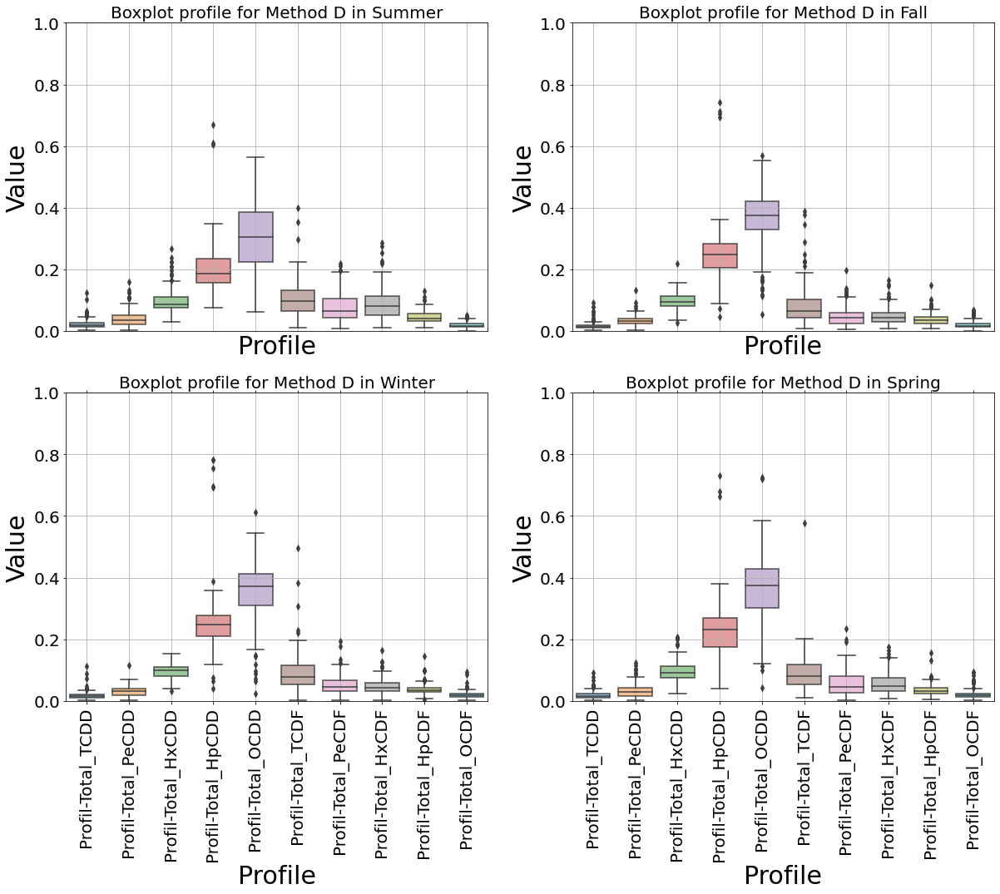

In [60]:
PRO_hom = ['Profil-Total_TCDD' , 'Profil-Total_PeCDD' , 
       'Profil-Total_HxCDD' , 'Profil-Total_HpCDD' , 'Profil-Total_OCDD' , 'Profil-Total_TCDF' , 
       'Profil-Total_PeCDF' , 'Profil-Total_HxCDF' , 'Profil-Total_HpCDF' , 'Profil-Total_OCDF']
df_methodeD_boxplot_ = df_methodeD_boxplot[df_methodeD_boxplot['Profile'].isin(PRO_hom)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeD_boxplot_[df_methodeD_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method D in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

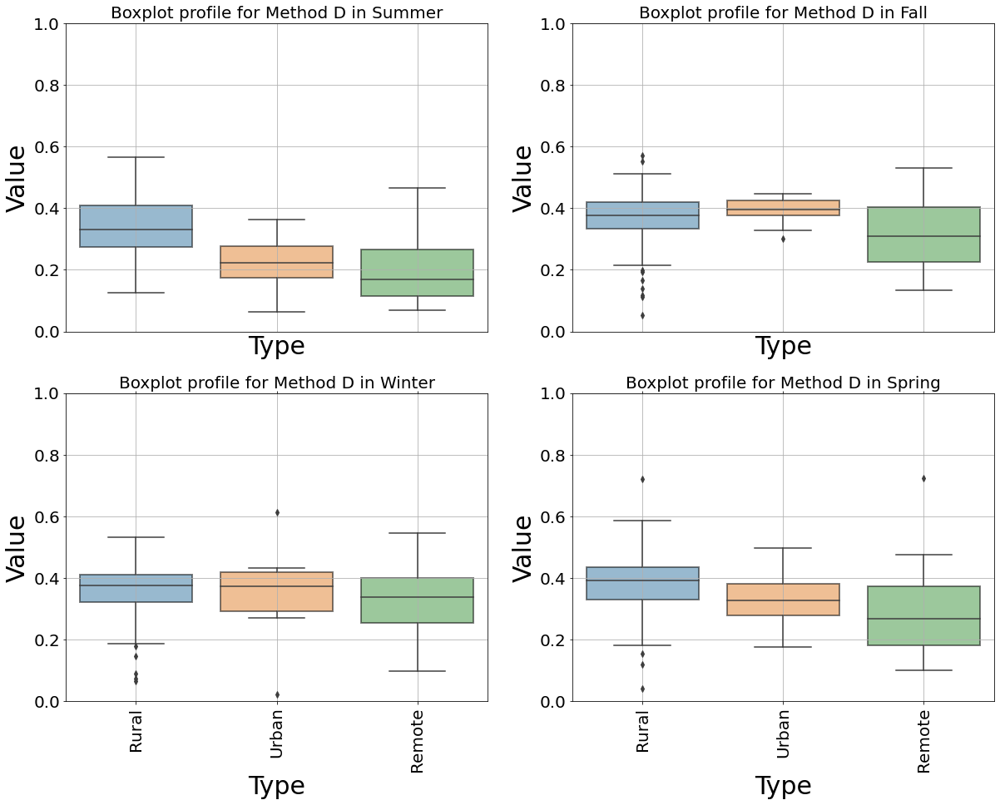

In [61]:
PRO_hom = ['Profil-Total_OCDD']
df_methodeD_boxplot_ = df_methodeD_boxplot[df_methodeD_boxplot['Profile'].isin(PRO_hom)]
X='Type'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeD_boxplot_[df_methodeD_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method D in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.setp(ax.artists, alpha=.5, linewidth=2, edgecolor="k")
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

## 6- Methode E
### 6.1 - Implementation on one sample

No handles with labels found to put in legend.


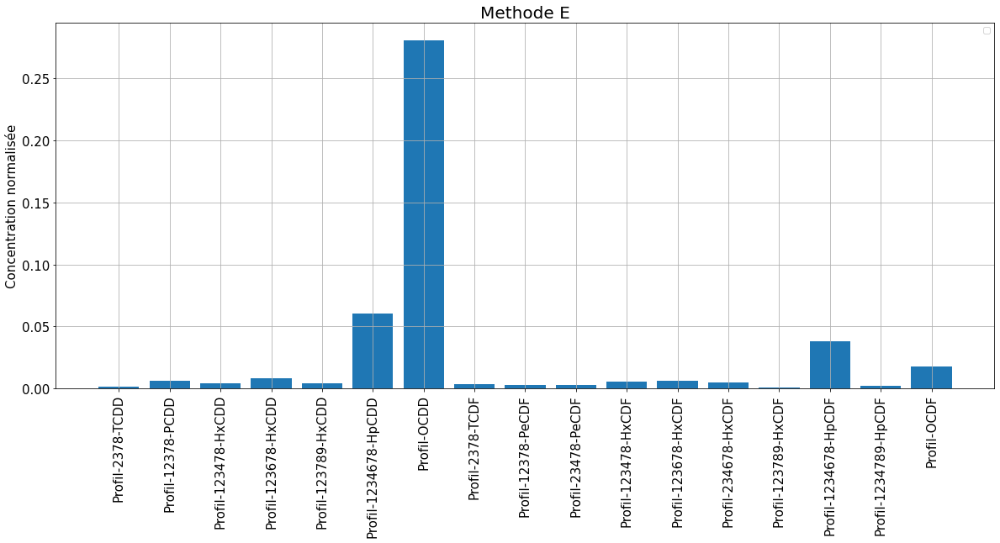

In [62]:
df_methodeE = df.copy()


congeneres = ['2378-TCDD', '12378-PCDD', '123478-HxCDD', '123678-HxCDD',
       '123789-HxCDD', '1234678-HpCDD', 'OCDD', '2378-TCDF', '12378-PeCDF',
       '23478-PeCDF', '123478-HxCDF', '123678-HxCDF', '234678-HxCDF',
       '123789-HxCDF', '1234678-HpCDF', '1234789-HpCDF', 'OCDF']


df_methodeE['TOTAL Global'] = df_methodeE['Total TCDD']+df_methodeE['Total PeCDD']+df_methodeE['Total HxCDD']+df_methodeE['Total HpCDD']+df_methodeE['OCDD']+ \
                              df_methodeE['Total TCDF']+df_methodeE['Total PeCDF']+df_methodeE['Total HxCDF']+df_methodeE['Total HpCDF']+df_methodeE['OCDF'] 


for i in congeneres:
    df_methodeE['Profil-'+i] = df_methodeE[i]/df_methodeE['TOTAL Global']


plt.rcParams["figure.figsize"] = (20,8)
plt.bar(df_methodeE.columns[-17:], df_methodeE.values[0][-17:])

plt.title(f"Methode E",fontsize=20)
plt.yticks(fontsize=15)
plt.ylabel('Concentration normalisée',fontsize=15)
plt.xticks(fontsize=15,rotation=90)


plt.legend()
plt.grid()
plt.show()

### 6.2 - Boxplot of all sites

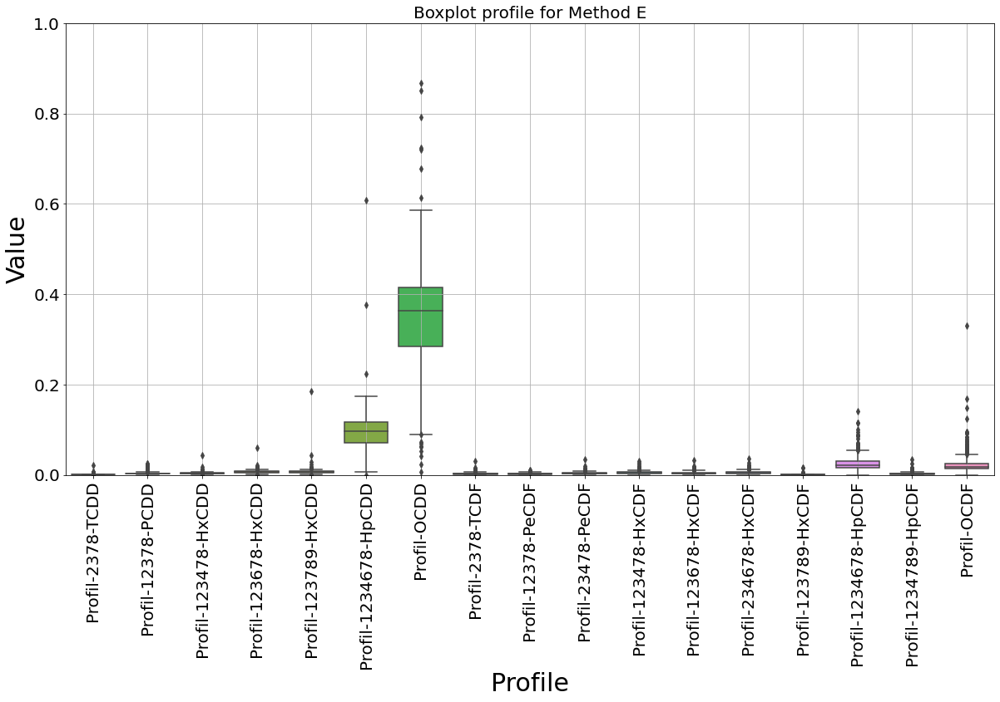

In [63]:
Profiles = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeE_boxplot = pd.DataFrame(columns=['Site', 'Type', 'Site #', 'Moment', 'Dates', 'Year', 'Season', 'Profile', 'Value'])


for i in range(736):
    for j,p in enumerate(Profiles):
        df_methodeE_boxplot.loc[i*len(Profiles)+j] = list(df_methodeE.values[i][:7]) + [p,df_methodeE.values[i][j+46]]


PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeE_boxplot_ = df_methodeE_boxplot[df_methodeE_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


plt.figure(figsize = (20, 10))
plt.title("Boxplot profile for Method E",fontsize=20)
ax = sns.boxplot(x=X, y=Y, data=df_methodeE_boxplot_)
ax.set_xlabel(X, fontsize = 30)
ax.set_ylabel(Y, fontsize = 30)
plt.xticks(fontsize = 20, rotation=90)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()

plt.show()

### 6.3- Vue by site

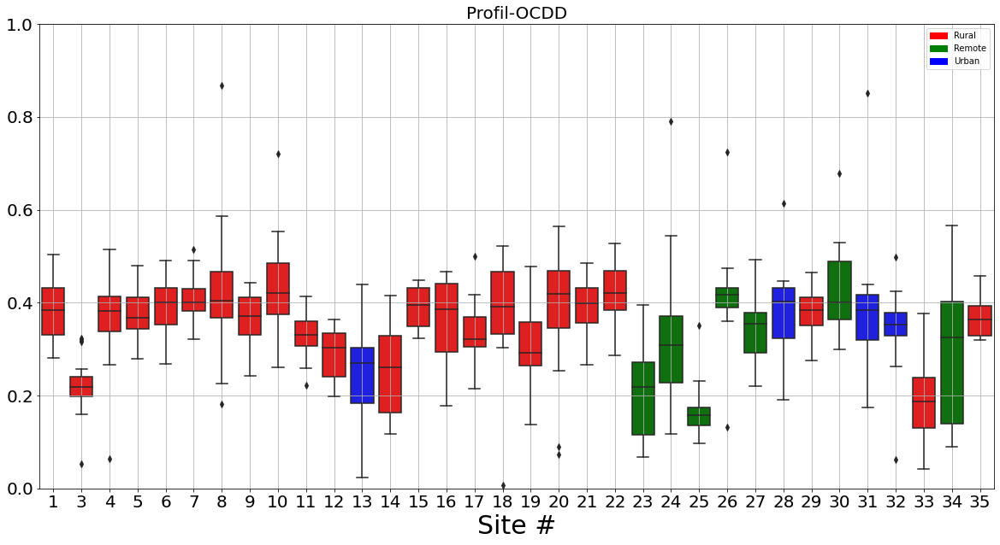

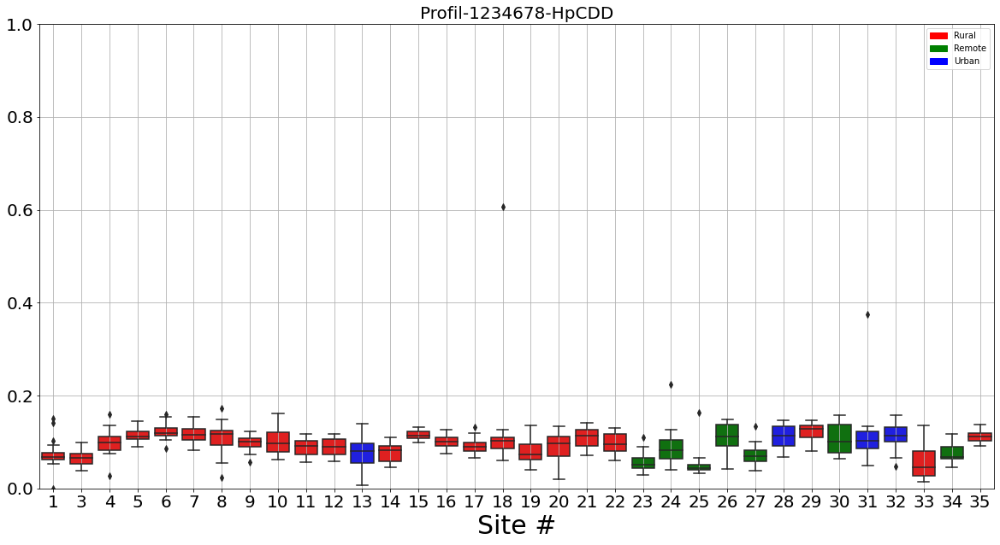

In [64]:
plt.figure(figsize = (20, 10))
plt.title("Profil-OCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeE_boxplot_[df_methodeE_boxplot_['Profile']=='Profil-OCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

plt.figure(figsize = (20, 10))
plt.title("Profil-1234678-HpCDD",fontsize=20)
ax = sns.boxplot(x='Site #', y='Value', data=df_methodeE_boxplot_[df_methodeE_boxplot_['Profile']=='Profil-1234678-HpCDD'], palette=L)
ax.set_xlabel('Site #', fontsize = 30)
ax.set_ylabel('', fontsize = 30)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.ylim(0,1)
plt.grid()
rural_patch = mpatches.Patch(color='red', label='Rural')
remote_patch = mpatches.Patch(color='green', label='Remote')
urban_patch = mpatches.Patch(color='blue', label='Urban')
plt.legend(handles=[rural_patch, remote_patch, urban_patch])

plt.show()

### 6.4 - Boxplot by type

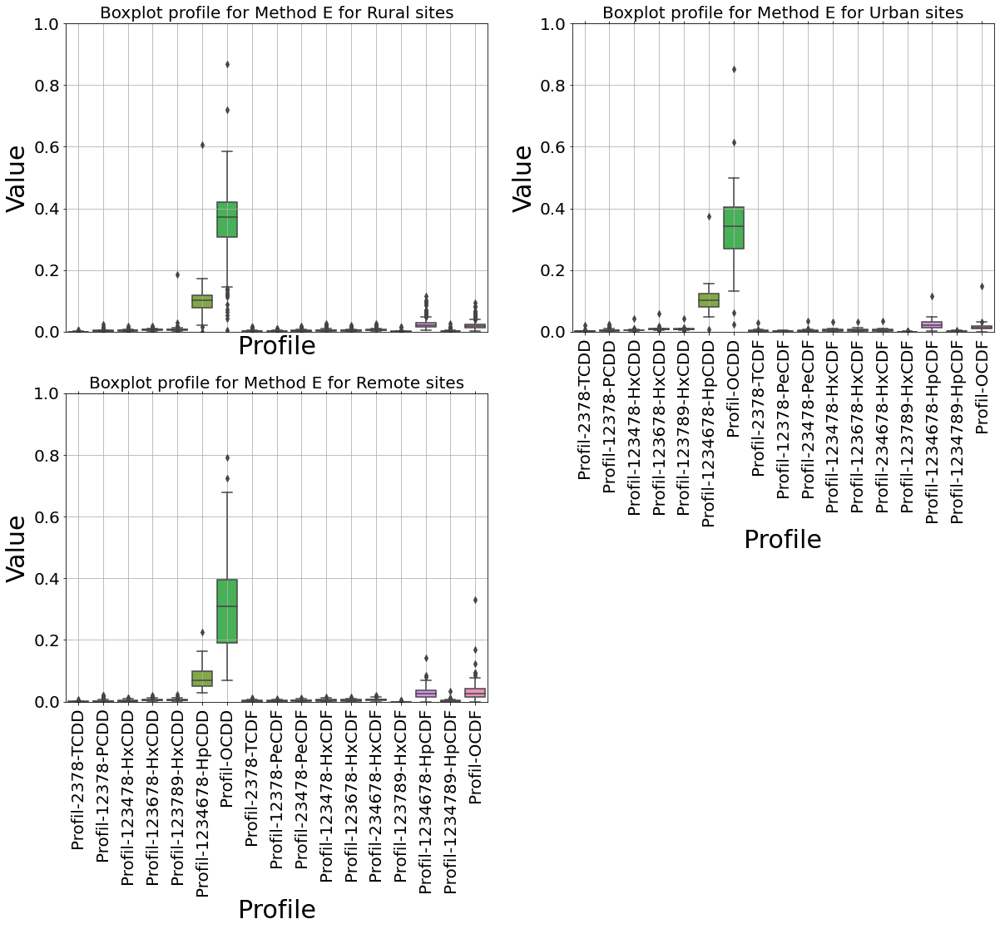

In [65]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeE_boxplot_ = df_methodeE_boxplot[df_methodeE_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Rural', 'Urban', 'Remote']):
    to_plot = df_methodeE_boxplot_[df_methodeE_boxplot_['Type']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method E for {i} sites",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3 or j==1:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()

### 6.5 - Boxplot by season

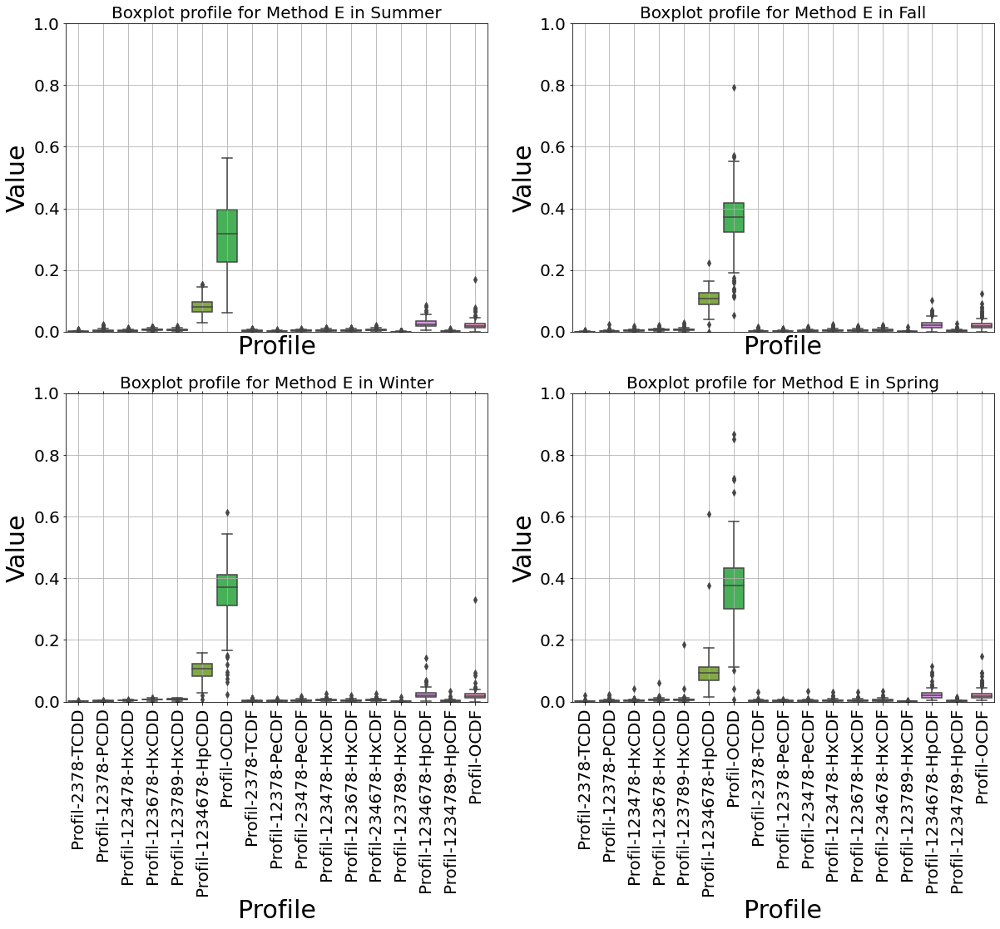

In [67]:
PRO = ['Profil-2378-TCDD', 'Profil-12378-PCDD',
       'Profil-123478-HxCDD', 'Profil-123678-HxCDD', 'Profil-123789-HxCDD',
       'Profil-1234678-HpCDD', 'Profil-OCDD', 'Profil-2378-TCDF',
       'Profil-12378-PeCDF', 'Profil-23478-PeCDF', 'Profil-123478-HxCDF',
       'Profil-123678-HxCDF', 'Profil-234678-HxCDF', 'Profil-123789-HxCDF',
       'Profil-1234678-HpCDF', 'Profil-1234789-HpCDF', 'Profil-OCDF']
df_methodeE_boxplot_ = df_methodeE_boxplot[df_methodeE_boxplot['Profile'].isin(PRO)]
X='Profile'
Y='Value'


f = plt.figure(figsize=(20,15))

for j,i in enumerate(['Summer', 'Fall', 'Winter', 'Spring']):
    to_plot = df_methodeE_boxplot_[df_methodeE_boxplot_['Season']==i]
    ax = f.add_subplot(2,2, j+1)
    plt.title(f"Boxplot profile for Method E in {i}",fontsize=20)
    ax = sns.boxplot(x=X, y=Y, data=to_plot)
    plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    if j==2 or j==3:
        plt.tick_params(axis='x', which='both', bottom=True, top=True, labelbottom=True)
    ax.set_xlabel(X, fontsize = 30)
    ax.set_ylabel(Y, fontsize = 30)
    plt.xticks(fontsize = 20, rotation=90)
    plt.yticks(fontsize = 20)
    plt.ylim(0,1)
    plt.grid()

plt.show()